# Extremes around QIN region

In [48]:
# import libraries
import numpy as np
import pandas as pd
#import geopandas as gpd
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import cartopy.feature as cfeature
import seaborn as sns
import warnings
warnings.simplefilter('ignore') # filter some warning messages

In [10]:
def mhw_region(fn,  clim_iy=1993, clim_fy=2019, detrend=False,ssp='ssp245'):
    # read file
    ds = xr.open_dataset(fn)
    ds.close()
    
    qbox = np.array([[-124.05,-124.33,-125.07,-124.774,-124.05],[46.53,47.4,47.4,46.53,46.53]])

    ds.coords['lon'] = np.mod(ds.coords['lon'] + 180,360) - 180
    ds = ds.sortby(ds.lon)
    
    ds = ds.rename({'lat':'latitude','lon':'longitude','thetao':'nsst'})
    #ds = ds.sel(latitude=slice(qinys,qinyn ),longitude=slice(qinxw,qinxe))
    
    iy = ds.time.dt.year[0].data
    fy = ds.time.dt.year[-1].data
    lat1 = int(np.floor(ds.latitude[0].data))
    lat2 = int(np.ceil(ds.latitude[-1].data))
    lon1 = int(np.floor(ds.longitude[0].data))
    lon2 = int(np.ceil(ds.longitude[-1].data))
    if lat1>lat2:
        tmp=lat1
        lat1=lat2
        lat2=tmp
    if lon1 > lon2:
        tmp=lon1
        lon1 = lon2
        lon2 = tmp
    if lat2-lat1>10:
        dlat = 5
    else:
        dlat = 1
    if lon2-lon1>10:
        dlon = 5
    else:
        dlon = 1  
    
    if detrend==True:
        nt=len(ds.time)
        nlat=len(ds.latitude)
        nlon=len(ds.longitude)
        a = ds.nsst.values.reshape((nt,-1))
        if ssp=='ssp585':
            b=np.apply_along_axis(detrend_2p, 0, a)   
        b=np.apply_along_axis(detrend_1l, 0, a)
        dtrend = xr.DataArray(b.reshape((nt,nlat,nlon)),                                  
                          name='nsst',             
                          coords={'time':ds.time,'latitude':ds.latitude,'longitude':ds.longitude},    
                          dims=('time','latitude','longitude')) 
        ds=dtrend.to_dataset()
        
    # calculate climatology (smooth) and anomalies (per grid point)
    climatology = ds.sel(time=slice(str(clim_iy)+'-01-01',str(clim_fy)+'-12-31')).groupby("time.month").mean("time")
    anomalies = ds.groupby("time.month") - climatology
    std = anomalies.nsst.sel(time=slice(str(clim_iy)+'-01-01',str(clim_fy)+'-12-31')).std(skipna=True)
    #thre_90 = np.nanpercentile (anomalies.nsst.sel(time=slice(str(clim_iy)+'-01-01',str(clim_fy)+'-12-31')),90)
    thre_90 = anomalies.nsst.sel(time=slice(str(clim_iy)+'-01-01',str(clim_fy)+'-12-31')).quantile(.9,dim='time')
    #anomalies = ds.groupby("time.month") - climatology

    # calculatee thresholds - based on standard deviations based on climatology period
    thres = thre_90.data  
        
    # # per decade, # months above the threshold (right now 1 standard deviation)
    iy = int(np.floor(iy/10)*10)
    
    mhws = np.full((len(range(iy,fy,10)),len(anomalies.latitude),len(anomalies.longitude)),np.nan)
    di = 0
    # number of decades
    for i in range(iy, fy,10):
        tmp = anomalies.nsst.sel(time=slice(str(i)+'-01-01',str(i+9)+'-12-31')) #anomalies
        npt = len(tmp[:,0,0].data)
        mask = tmp[0,:,:].data*0+1
        tmp1 = tmp.where(tmp>=thres)
        #print(tmp1)
        tmp1 = tmp1*0+1
        tmp2 = tmp1.sum(dim={'time'},skipna=True)
        tmp2 = tmp2*100/npt
        tmp2 = tmp2*mask
        
        mhws[di,:,:]=tmp2.data
        di += 1
       
        plt.figure(figsize=(4,3.5))
        ax = plt.axes(projection=ccrs.PlateCarree())
        ax.coastlines(resolution='50m',linewidth=1,color='black',alpha=0.8,zorder=1)
        #entire region
        ax.set_extent([lon1,lon2,lat1,lat2],crs=ccrs.PlateCarree())
        ax.set_xticks([*range(lon1,lon2+1,dlon)], crs=ccrs.PlateCarree())
        ax.set_yticks([*range(lat1,lat2+1,dlat)], crs=ccrs.PlateCarree())
        ax.xaxis.set_major_formatter(LongitudeFormatter(zero_direction_label=True))
        ax.yaxis.set_major_formatter(LatitudeFormatter())
        vmin=0
        vmax=101
        lev=np.arange(vmin,vmax,10) 
        plt.contourf(tmp2.longitude, tmp2.latitude,tmp2, cmap='jet', levels=lev,extend="both",)
        plt.colorbar(fraction=0.04, pad=0.05)
        plt.grid(True, zorder=0,alpha=0.5)
        plt.plot(qbox[0,:],qbox[1,:],c='cyan',lw=1, alpha=0.7)
        ax.set_aspect(1.5)
        plt.title('MHW % time, '+str(i)+'-'+str(i+9))
        plt.show()        
 
    return  mhws   

In [11]:
def hypoxia_region(fn,  clim_iy=1993, clim_fy=2019):
    # read file
    ds0 = xr.open_dataset(fn)
    ds0.close()
    ds = ds0#convert_mmolm3_mll(ds0)
    
    qbox = np.array([[-124.05,-124.33,-125.07,-124.774,-124.05],[46.53,47.4,47.4,46.53,46.53]])

    ds.coords['lon'] = np.mod(ds.coords['lon'] + 180,360) - 180
    ds = ds.sortby(ds.lon)
    
    ds = ds.rename({'lat':'latitude','lon':'longitude','o2':'nsst'})
    #ds = ds.sel(latitude=slice(qinys,qinyn ),longitude=slice(qinxw,qinxe))
    
    iy = ds.time.dt.year[0].data
    fy = ds.time.dt.year[-1].data
    lat1 = int(np.floor(ds.latitude[0].data))
    lat2 = int(np.ceil(ds.latitude[-1].data))
    lon1 = int(np.floor(ds.longitude[0].data))
    lon2 = int(np.ceil(ds.longitude[-1].data))
    if lat1>lat2:
        tmp=lat1
        lat1=lat2
        lat2=tmp
    if lon1 > lon2:
        tmp=lon1
        lon1 = lon2
        lon2 = tmp
    if lat2-lat1>10:
        dlat = 5
    else:
        dlat = 1
    if lon2-lon1>10:
        dlon = 5
    else:
        dlon = 1  
    
    # calculate climatology (smooth) and anomalies (per grid point)
    climatology = ds.sel(time=slice(str(clim_iy)+'-01-01',str(clim_fy)+'-12-31')).groupby("time.month").mean("time")
    anomalies = ds.groupby("time.month") - climatology
    std = anomalies.nsst.sel(time=slice(str(clim_iy)+'-01-01',str(clim_fy)+'-12-31')).std(skipna=True)

    #anomalies = ds.groupby("time.month") - climatology
        
    # calculatee thresholds - based on standard deviations based on climatology period
    thres = 2. #ml/lstd.data
    
    # # per decade, # months above the threshold (right now 1 standard deviation)
    iy = int(np.floor(iy/10)*10)
    
    mhws = np.full((len(range(iy,fy,10)),len(anomalies.latitude),len(anomalies.longitude)),np.nan)
    di = 0
    # number of decades
    for i in range(iy, fy,10):
        tmp = ds.nsst.sel(time=slice(str(i)+'-01-01',str(i+9)+'-12-31')) #anomalies
        npt = len(tmp[:,0,0].data)
        mask = tmp[0,:,:].data*0+1
        tmp1 = tmp.where(tmp<=thres)
        tmp1 = tmp1*0+1
        tmp2 = tmp1.sum(dim={'time'},skipna=True)
        tmp2 = tmp2*100/npt
        tmp2 = tmp2*mask
        
        mhws[di,:,:]=tmp2.data
        di += 1
       
        plt.figure(figsize=(4,3.5))
        ax = plt.axes(projection=ccrs.PlateCarree())
        ax.coastlines(resolution='50m',linewidth=1,color='black',alpha=0.8,zorder=1)
        #entire region
        #ax.set_extent([ qinxw+1, qinxe-1, qinys+1, qinyn-1],crs=ccrs.PlateCarree())
        ax.set_extent([lon1,lon2,lat1,lat2],crs=ccrs.PlateCarree())
        ax.set_xticks([*range(lon1,lon2+1,dlon)], crs=ccrs.PlateCarree())
        ax.set_yticks([*range(lat1,lat2+1,dlat)], crs=ccrs.PlateCarree())
        ax.xaxis.set_major_formatter(LongitudeFormatter(zero_direction_label=True))
        ax.yaxis.set_major_formatter(LatitudeFormatter())
        vmin=0
        vmax=101
        lev=np.arange(vmin,vmax,10) 
        plt.contourf(tmp2.longitude, tmp2.latitude,tmp2, cmap='jet', levels=lev,extend="both",)
        plt.colorbar(fraction=0.04, pad=0.05)
        plt.grid(True, zorder=0,alpha=0.5)
        plt.plot(qbox[0,:],qbox[1,:],c='cyan',lw=1, alpha=0.7)
        ax.set_aspect(1.5)
        plt.title('Hypoxia % time, '+str(i)+'-'+str(i+9))
        plt.show()        

 
 
    return  mhws       

# Specify below the variable and location of variable you want to see

In [16]:
#specify location, if detrend for MHW

#location of variable- 'surface' 'bottom' 
#if detrend- True False

loc='bottom'
if_detrend=False 

figdir='/Volumes/GoogleDrive/My Drive/QIN/figures/'

#directory for masks
mask_dir ='/Volumes/GoogleDrive/My Drive/QIN/masks/'
print(loc)

bottom


/Volumes/GoogleDrive/My Drive/QIN/data/bottom thetao/ssp245/ACCESS-ESM1-5_r1i1p1f1_sd+ba_final_thetao_bottom_depth_None_subset.nc
model name:ACCESS-ESM1-5
this is model number: 1


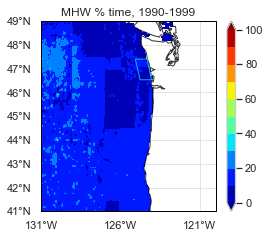

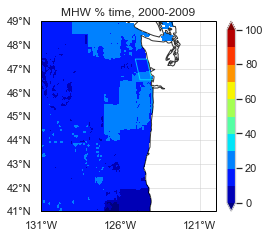

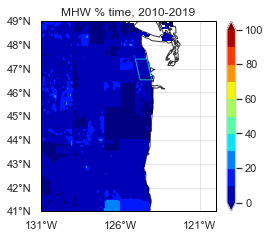

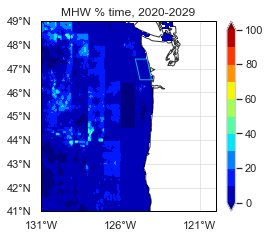

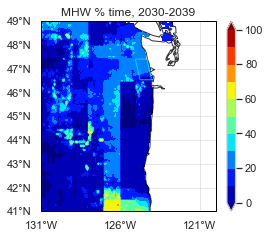

...

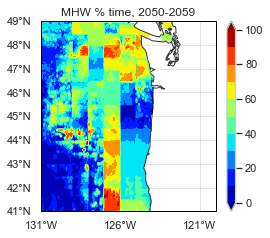

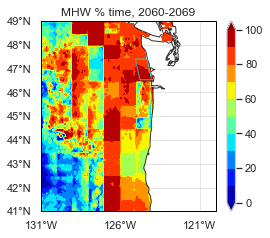

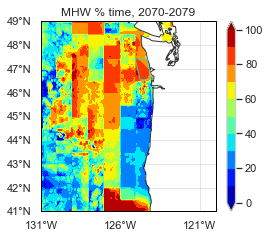

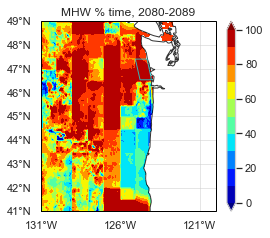

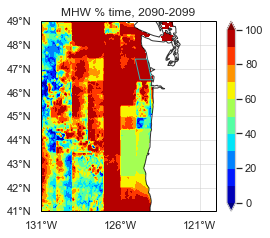

/Volumes/GoogleDrive/My Drive/QIN/data/bottom thetao/ssp245/CanESM5_r1i1p1f1_sd+ba_final_thetao_bottom_depth_None_subset.nc
model name:CanESM5
this is model number: 2


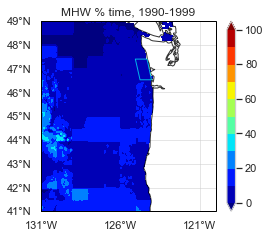

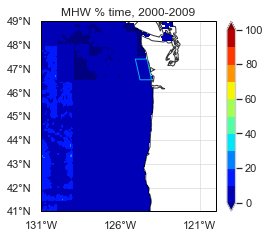

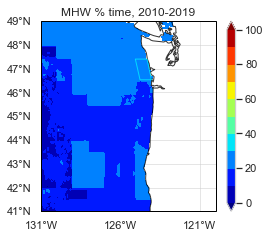

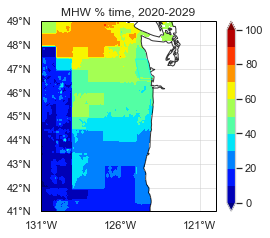

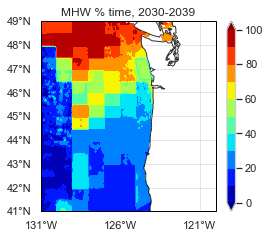

...

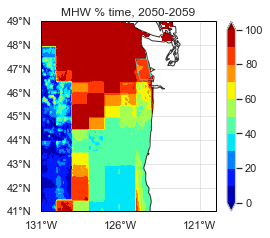

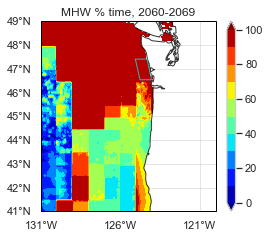

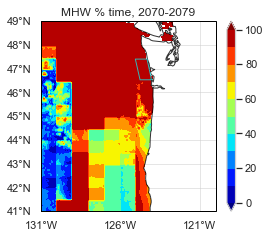

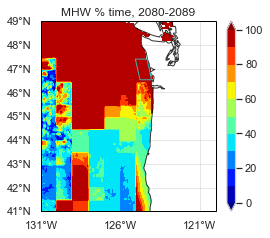

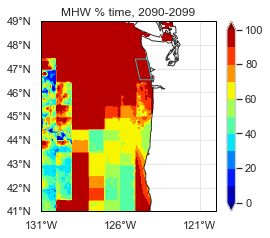

/Volumes/GoogleDrive/My Drive/QIN/data/bottom thetao/ssp245/GFDL-ESM4_r1i1p1f1_sd+ba_final_thetao_bottom_depth_None_subset.nc
model name:GFDL-ESM4
this is model number: 3


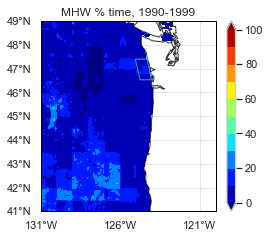

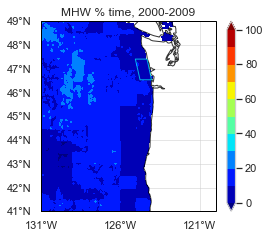

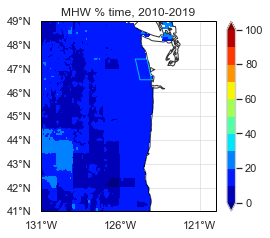

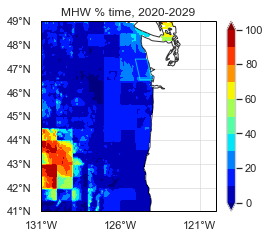

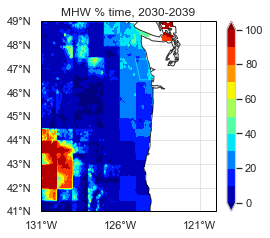

...

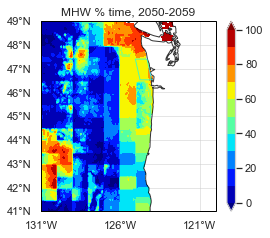

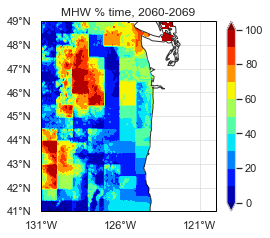

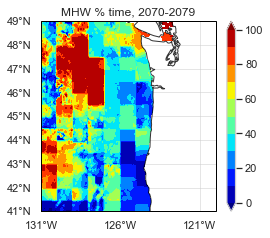

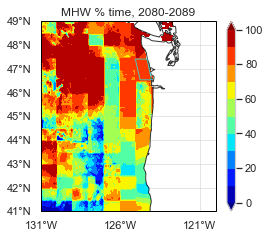

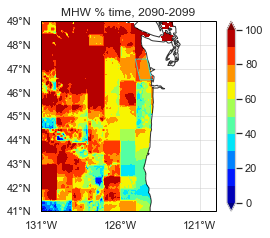

/Volumes/GoogleDrive/My Drive/QIN/data/bottom thetao/ssp245/IPSL-CM6A-LR_r1i1p1f1_sd+ba_final_thetao_bottom_depth_None_subset.nc
model name:IPSL-CM6A-LR
this is model number: 4


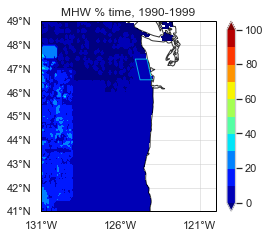

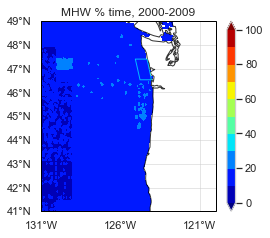

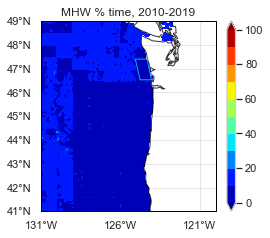

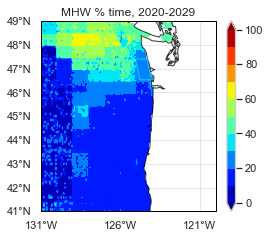

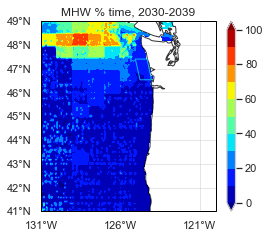

...

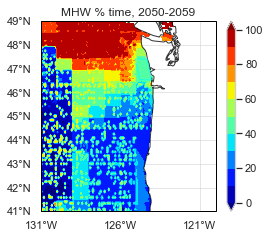

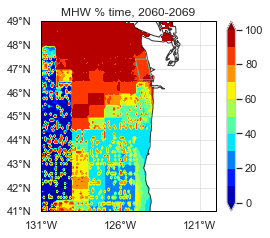

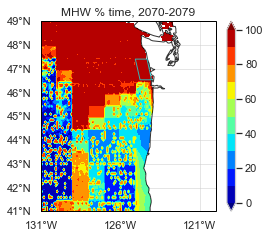

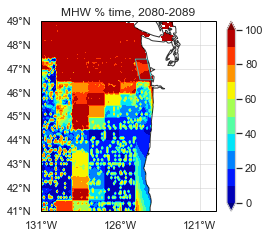

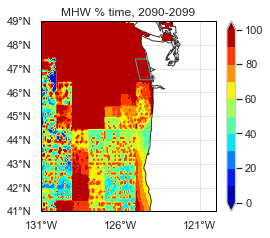

/Volumes/GoogleDrive/My Drive/QIN/data/bottom thetao/ssp245/UKESM1-0-LL_r1i1p1f2_sd+ba_final_thetao_bottom_depth_None_subset.nc
model name:UKESM1-0-LL
this is model number: 5


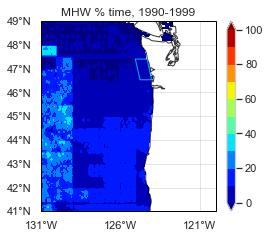

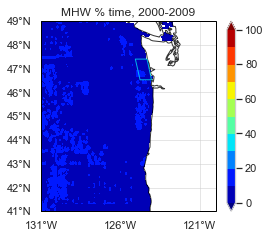

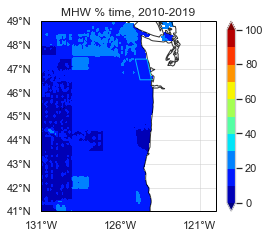

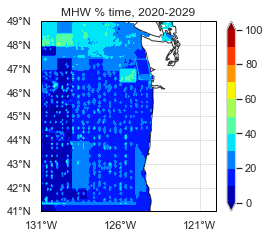

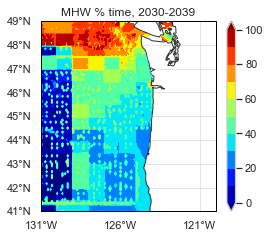

...

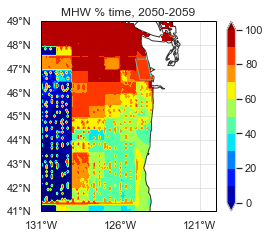

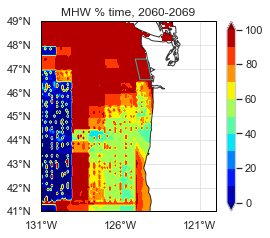

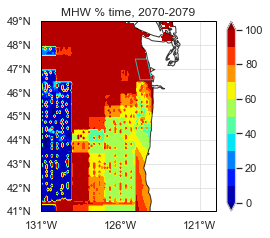

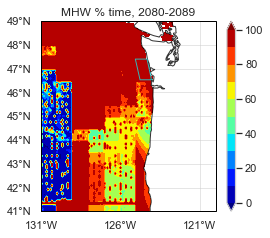

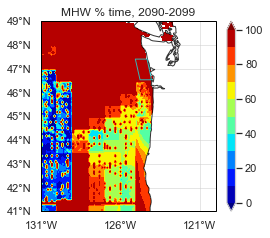

model name:ACCESS-ESM1-5
this is model number: 1


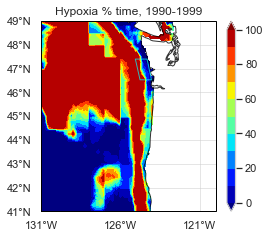

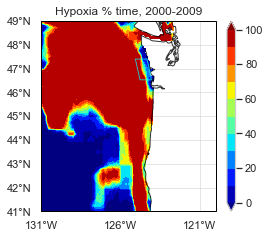

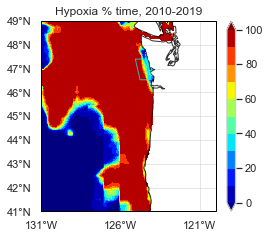

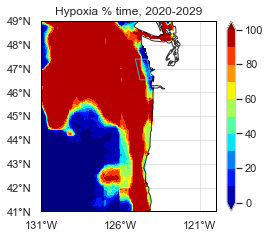

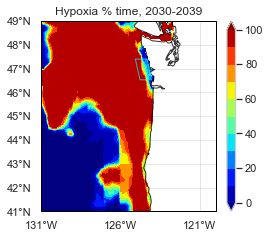

...

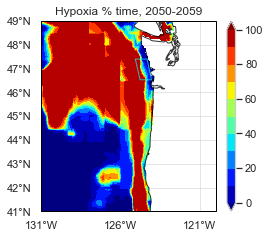

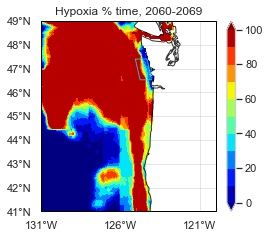

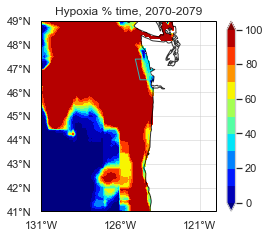

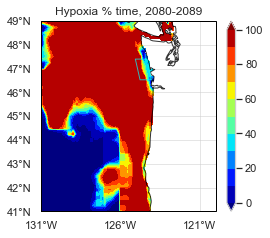

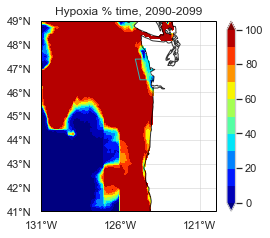

model name:CanESM5
this is model number: 2


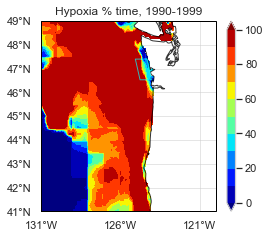

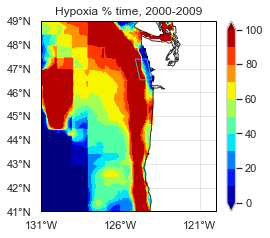

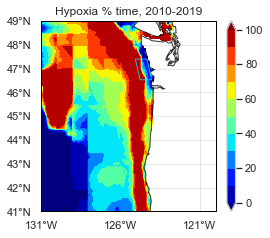

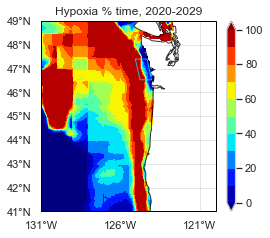

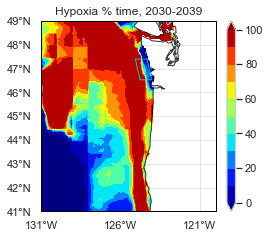

...

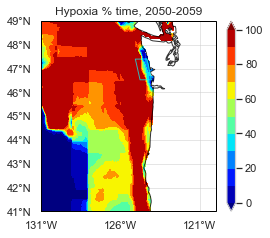

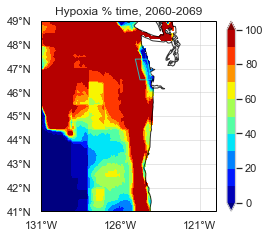

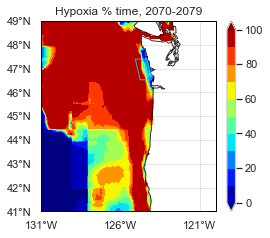

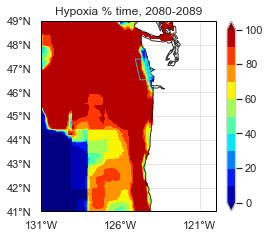

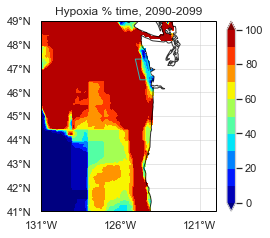

model name:UKESM1-0-LL
this is model number: 3


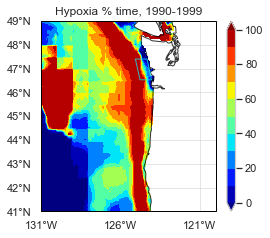

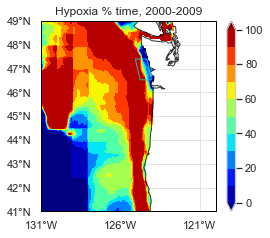

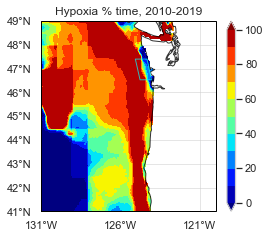

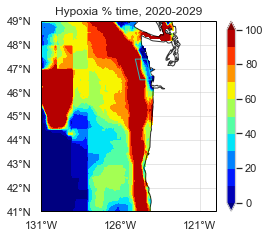

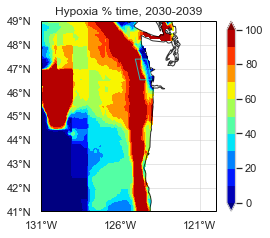

...

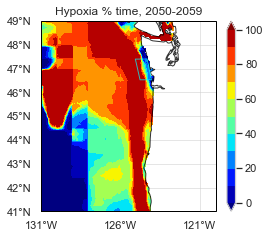

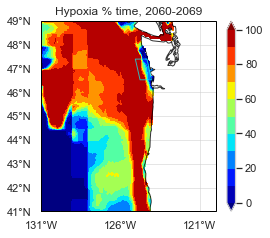

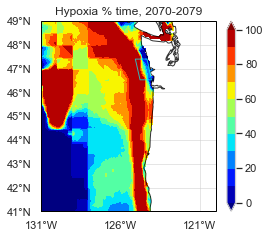

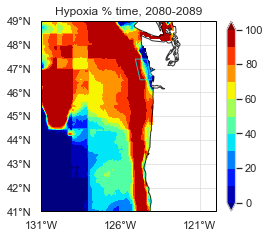

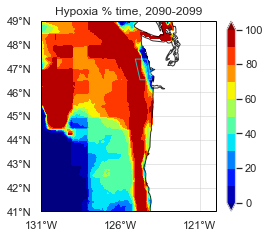

model name:UKESM1-0-LL
this is model number: 4


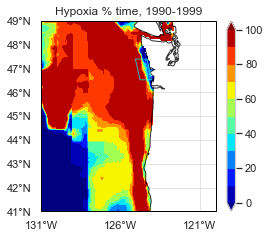

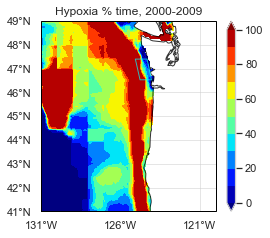

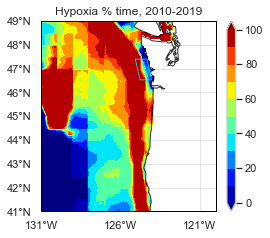

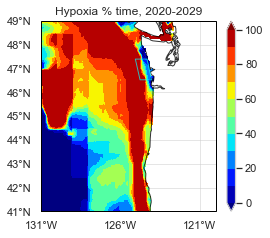

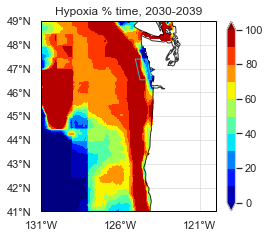

...

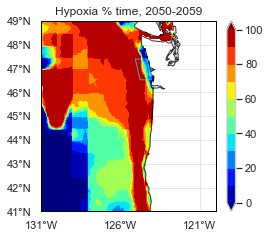

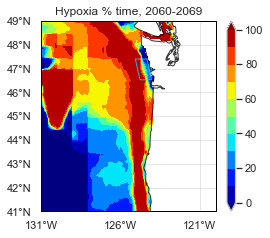

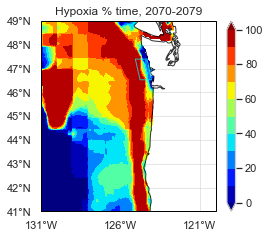

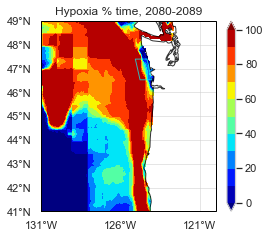

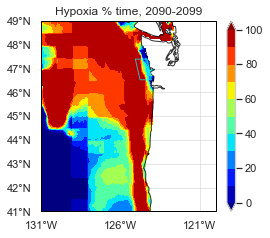

/Volumes/GoogleDrive/My Drive/QIN/data/bottom thetao/ssp585/CanESM5_r1i1p1f1_sd+ba_final_thetao_bottom_depth_None_subset.nc
model name:CanESM5
this is model number: 1


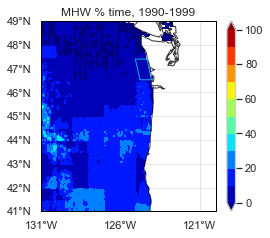

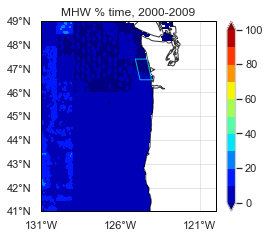

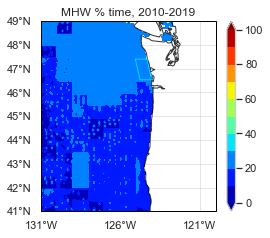

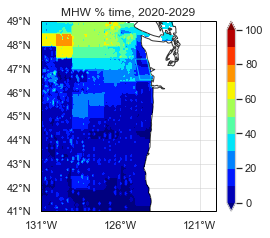

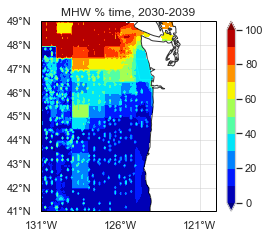

...

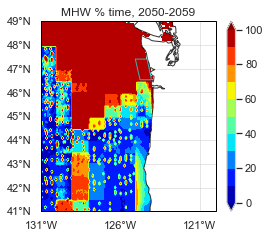

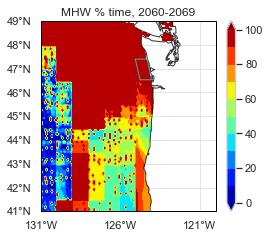

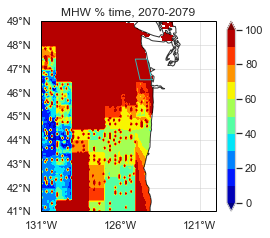

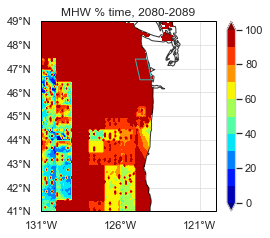

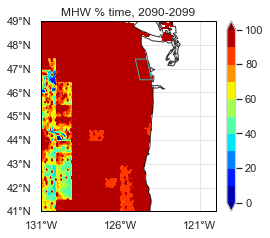

/Volumes/GoogleDrive/My Drive/QIN/data/bottom thetao/ssp585/CanESM5-CanOE_r2i1p2f1_sd+ba_final_thetao_bottom_depth_None_subset.nc
model name:CanESM5-CanOE
this is model number: 2


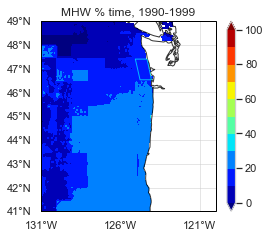

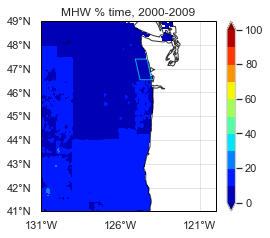

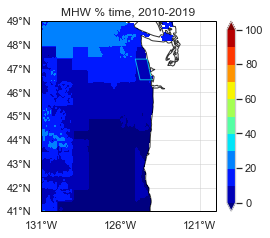

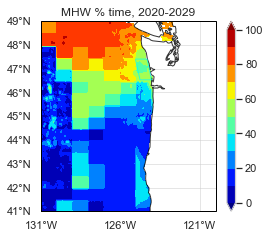

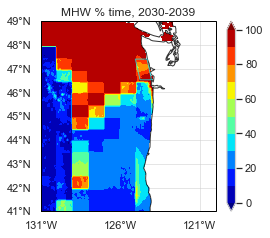

...

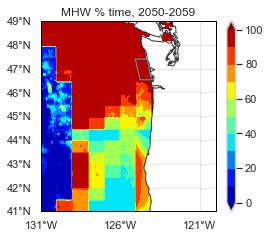

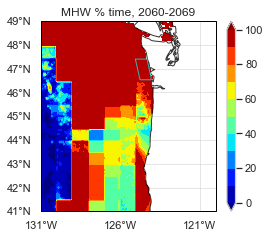

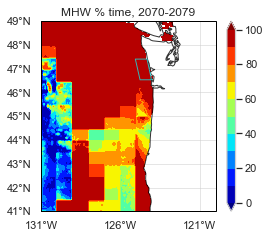

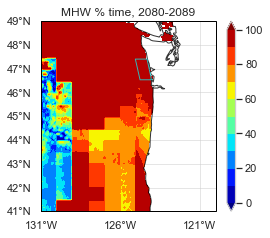

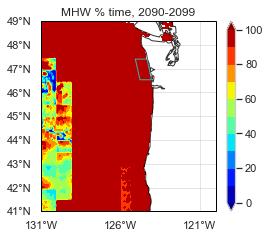

/Volumes/GoogleDrive/My Drive/QIN/data/bottom thetao/ssp585/CanESM5-CanOE_r3i1p2f1_sd+ba_final_thetao_bottom_depth_None_subset.nc
model name:CanESM5-CanOE
this is model number: 3


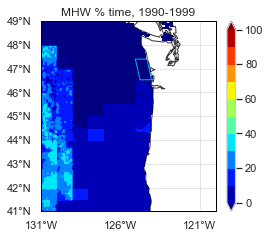

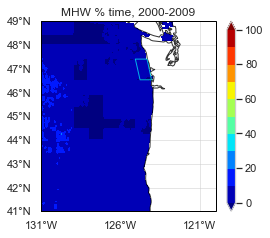

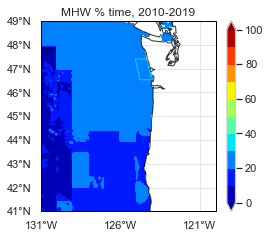

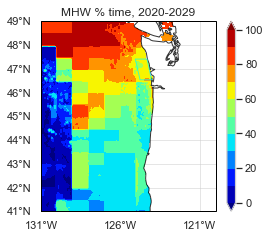

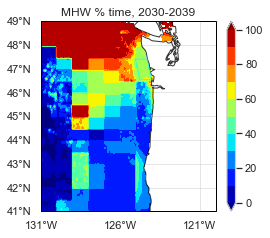

...

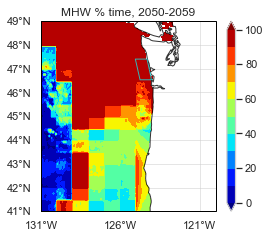

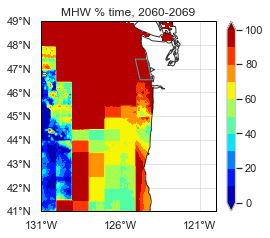

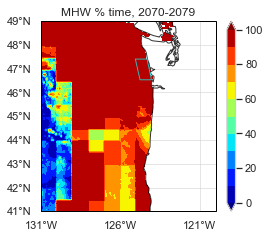

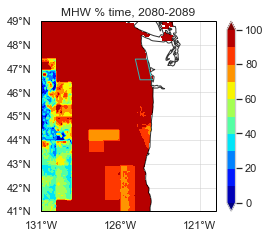

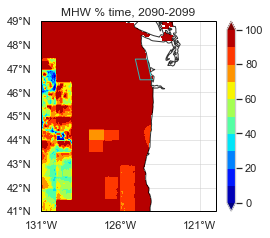

/Volumes/GoogleDrive/My Drive/QIN/data/bottom thetao/ssp585/CanESM5-CanOE_r1i1p2f1_sd+ba_final_thetao_bottom_depth_None_subset.nc
model name:CanESM5-CanOE
this is model number: 4


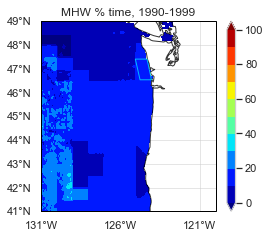

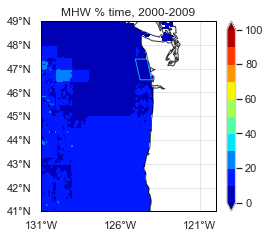

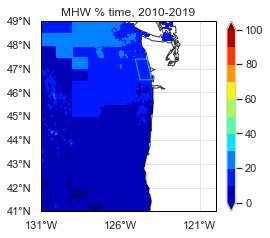

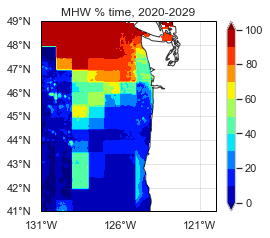

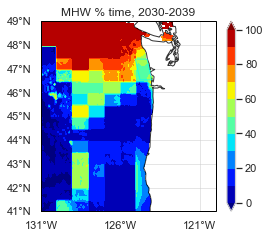

...

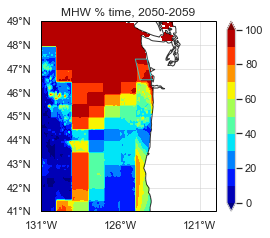

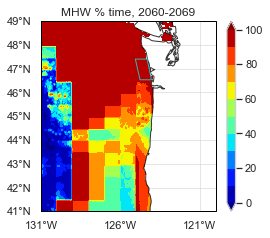

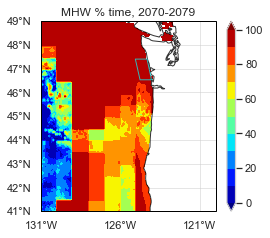

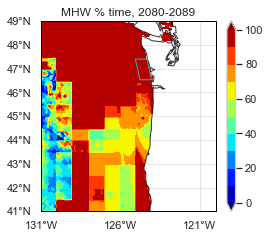

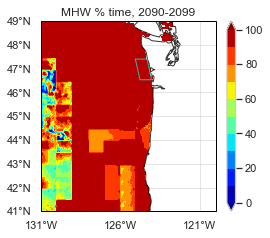

/Volumes/GoogleDrive/My Drive/QIN/data/bottom thetao/ssp585/IPSL-CM6A-LR_r1i1p1f1_sd+ba_final_thetao_bottom_depth_None_subset.nc
model name:IPSL-CM6A-LR
this is model number: 5


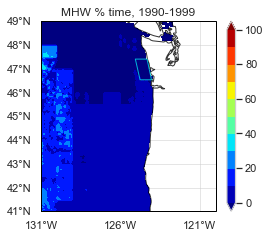

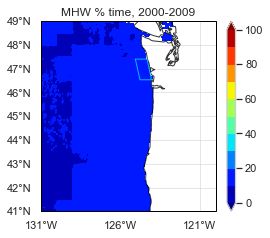

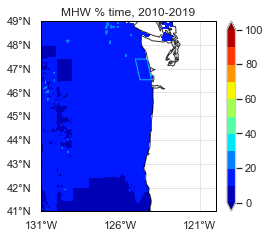

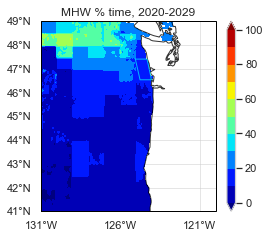

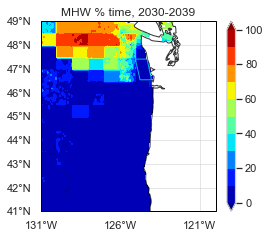

...

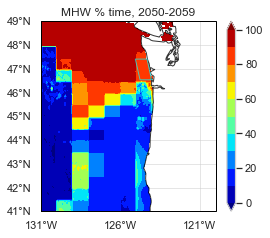

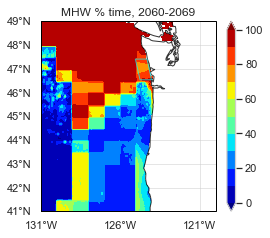

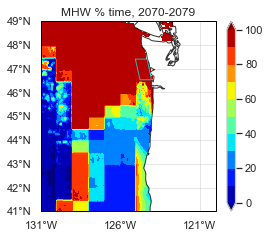

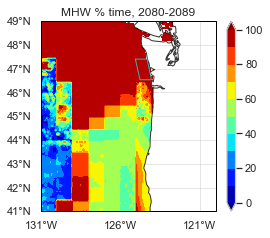

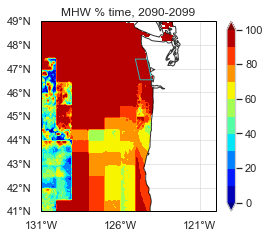

/Volumes/GoogleDrive/My Drive/QIN/data/bottom thetao/ssp585/UKESM1-0-LL_r3i1p1f2_sd+ba_final_thetao_bottom_depth_None_subset.nc
model name:UKESM1-0-LL
this is model number: 6


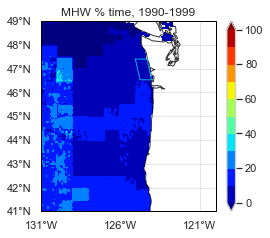

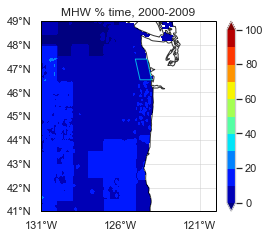

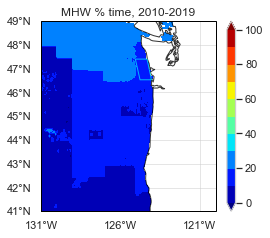

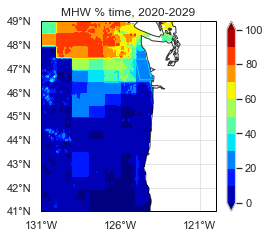

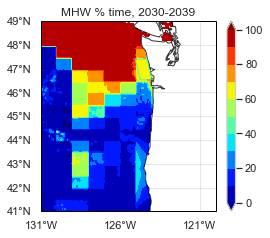

...

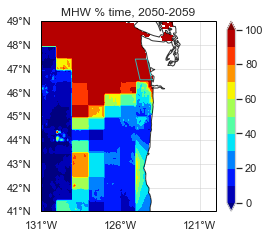

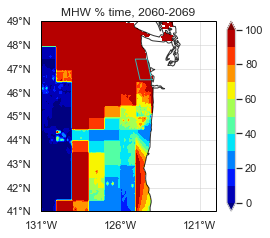

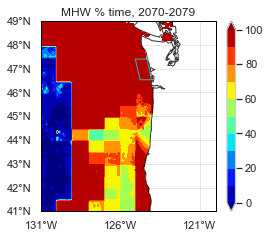

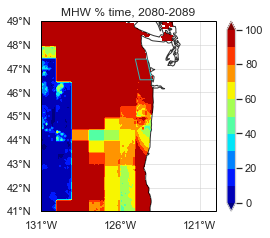

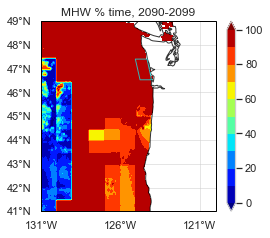

/Volumes/GoogleDrive/My Drive/QIN/data/bottom thetao/ssp585/GFDL-ESM4_r1i1p1f1_sd+ba_final_thetao_bottom_depth_None_subset.nc
model name:GFDL-ESM4
this is model number: 7


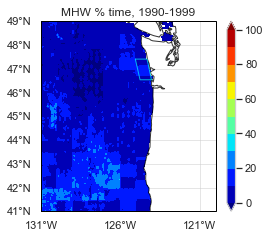

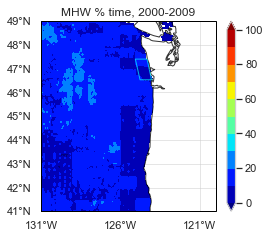

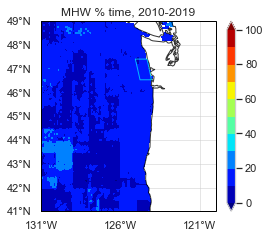

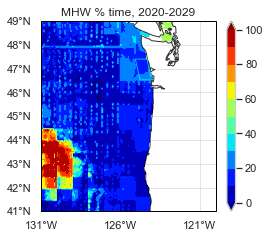

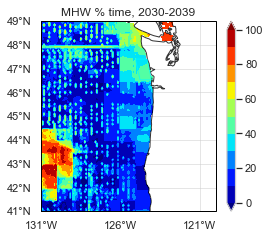

...

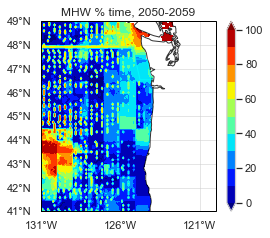

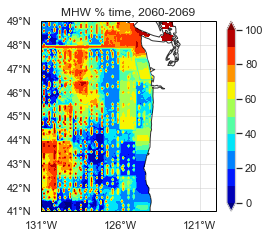

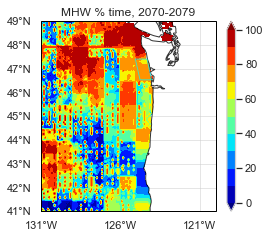

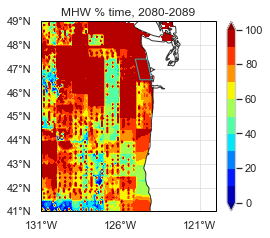

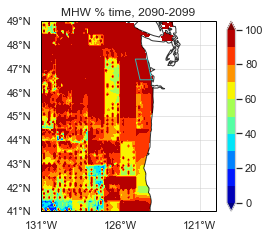

/Volumes/GoogleDrive/My Drive/QIN/data/bottom thetao/ssp585/UKESM1-0-LL_r1i1p1f2_sd+ba_final_thetao_bottom_depth_None_subset.nc
model name:UKESM1-0-LL
this is model number: 8


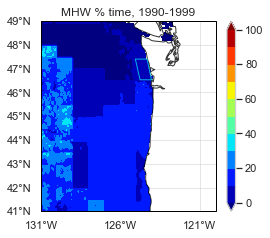

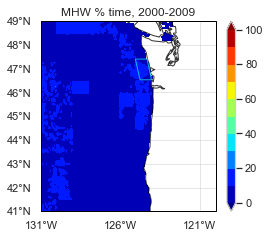

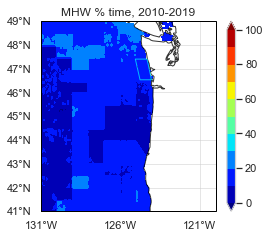

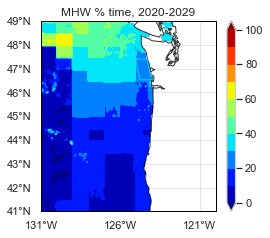

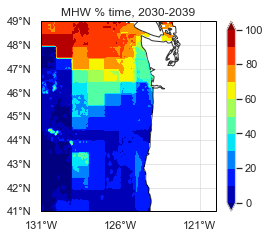

...

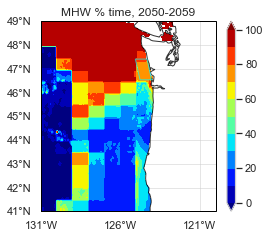

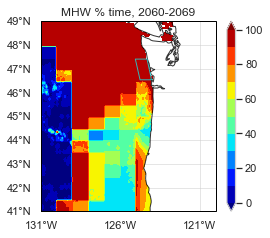

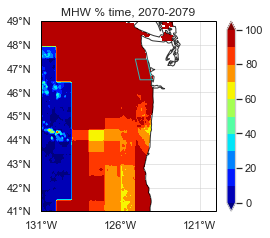

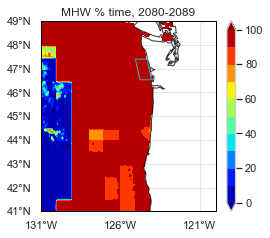

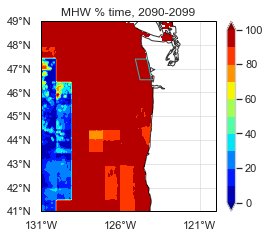

/Volumes/GoogleDrive/My Drive/QIN/data/bottom thetao/ssp585/UKESM1-0-LL_r2i1p1f2_sd+ba_final_thetao_bottom_depth_None_subset.nc
model name:UKESM1-0-LL
this is model number: 9


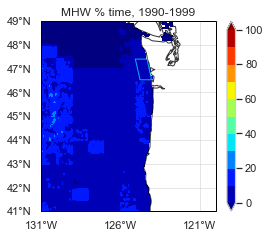

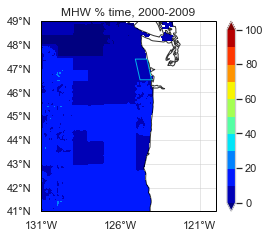

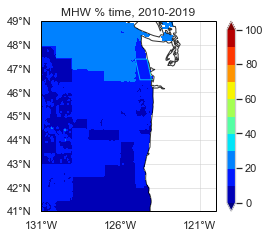

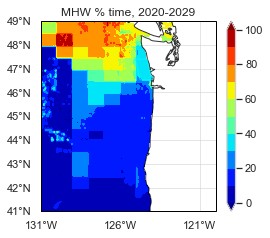

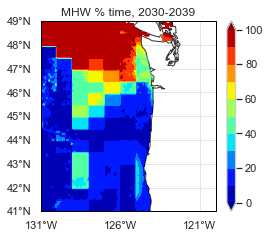

...

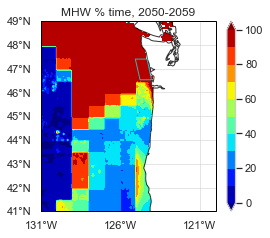

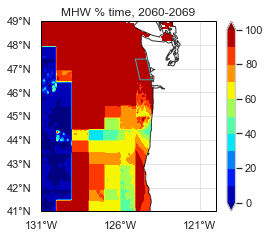

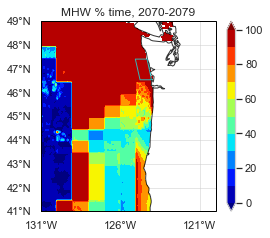

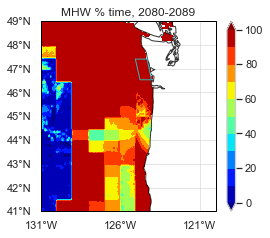

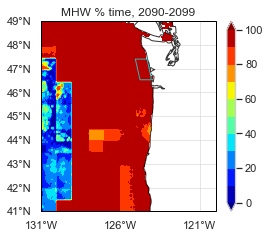

model name:CanESM5-CanOE
this is model number: 1


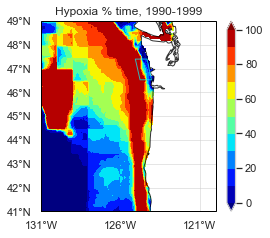

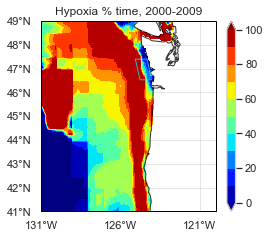

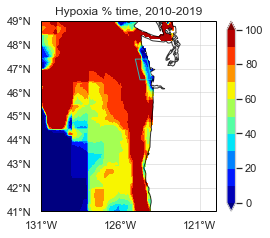

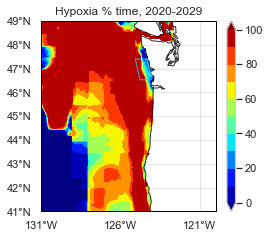

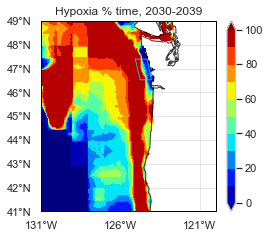

...

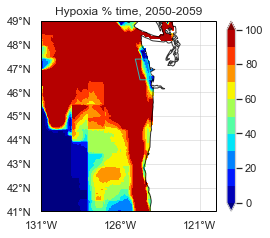

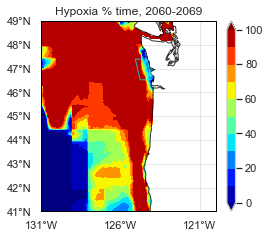

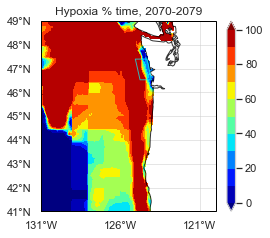

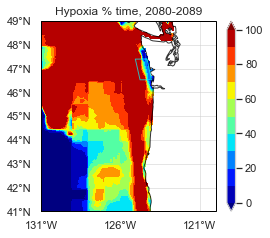

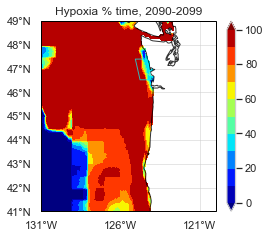

model name:CanESM5-CanOE
this is model number: 2


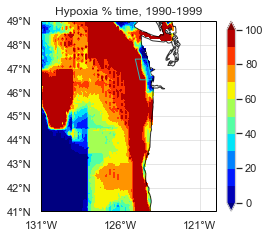

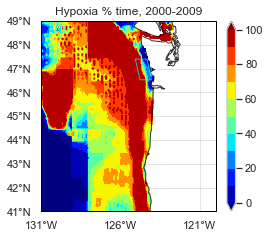

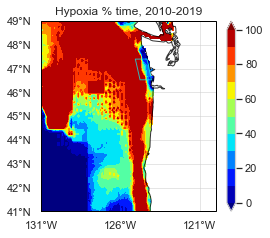

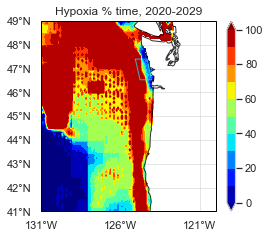

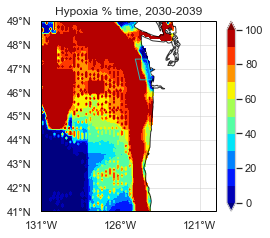

...

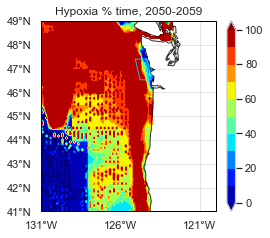

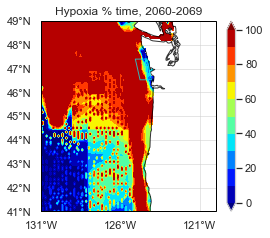

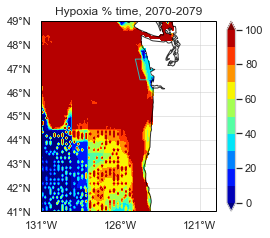

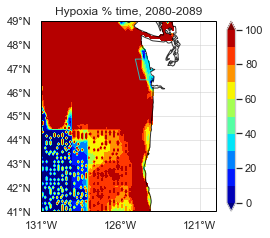

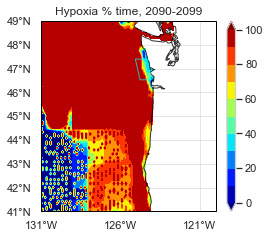

model name:CanESM5-CanOE
this is model number: 3


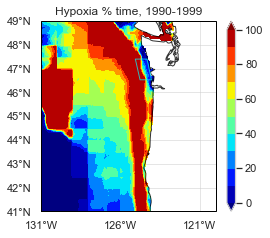

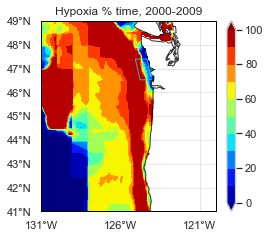

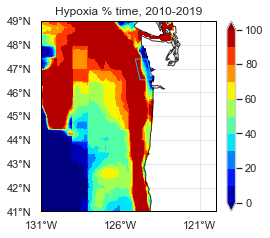

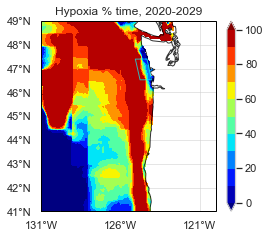

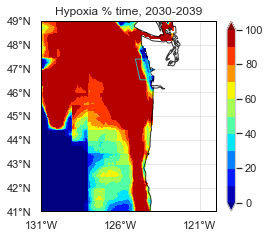

...

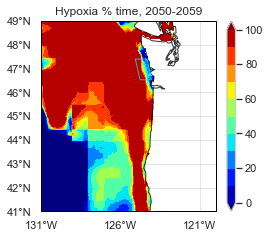

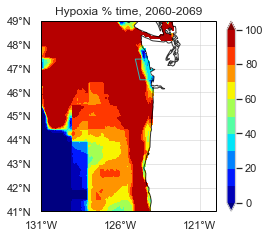

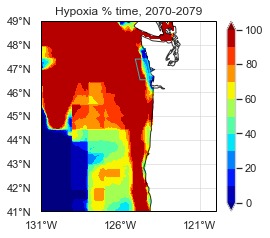

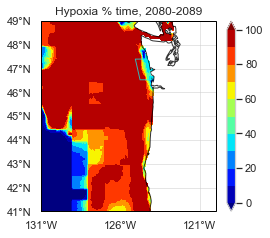

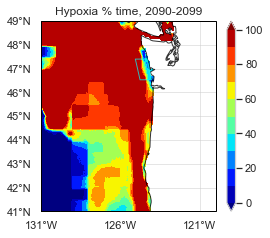

model name:CanESM5
this is model number: 4


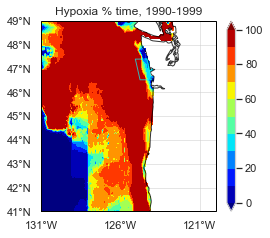

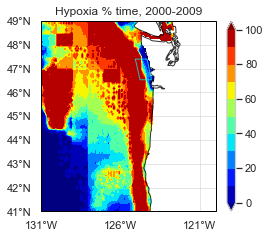

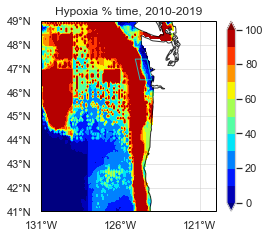

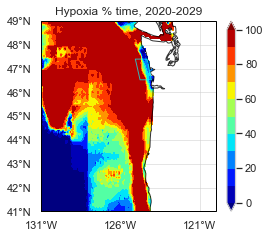

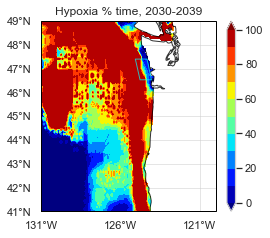

...

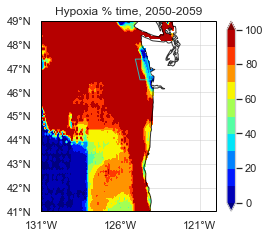

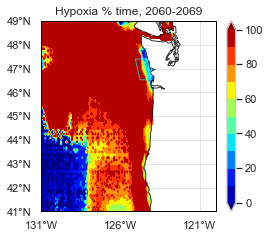

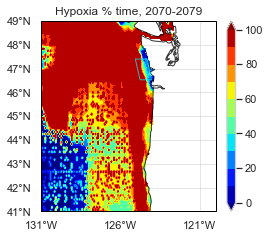

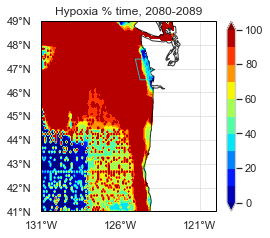

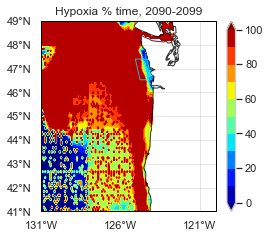

model name:IPSL-CM6A-LR
this is model number: 5


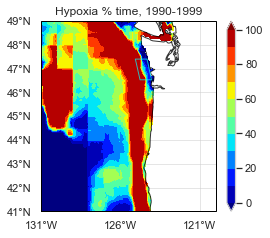

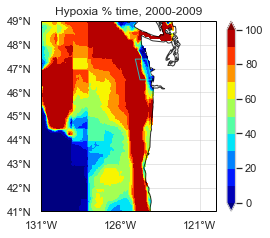

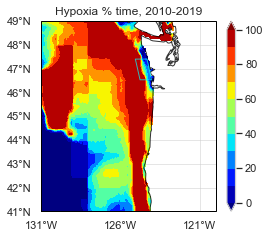

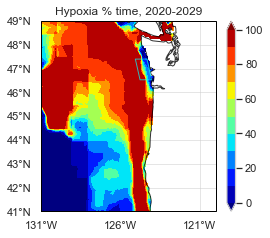

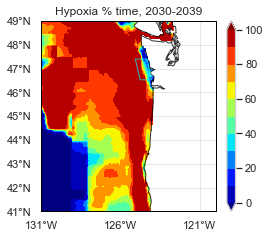

...

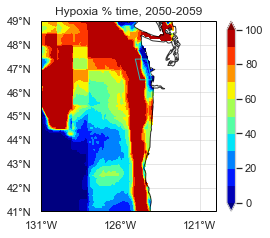

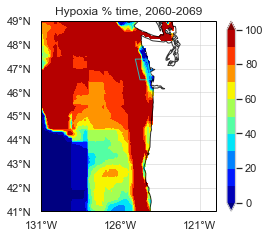

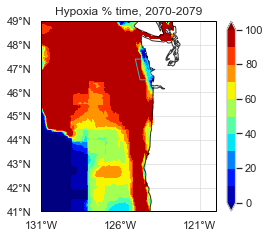

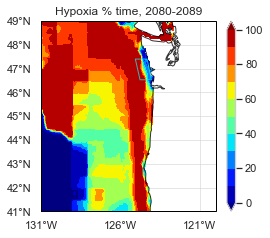

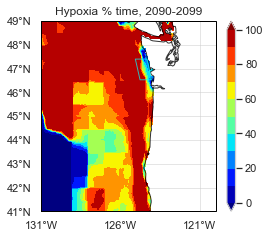

model name:UKESM1-0-LL
this is model number: 6


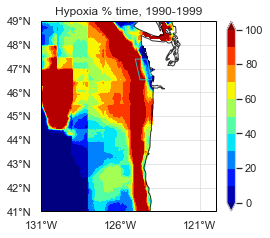

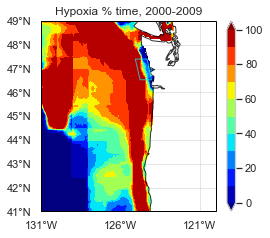

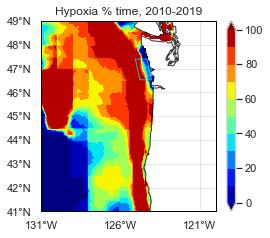

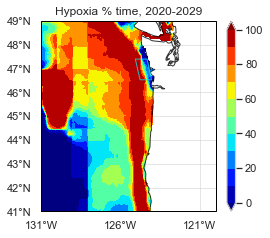

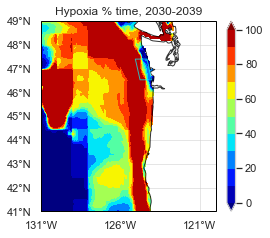

...

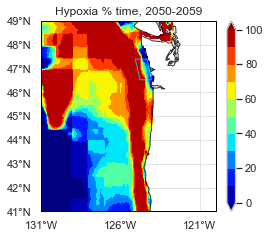

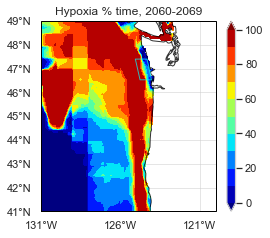

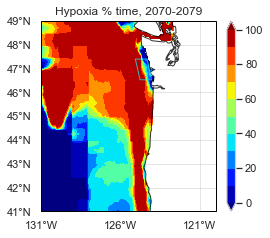

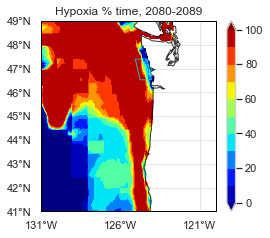

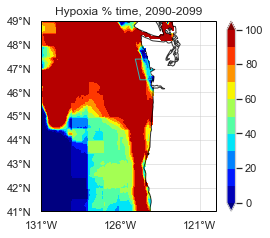

model name:UKESM1-0-LL
this is model number: 7


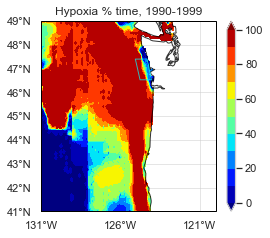

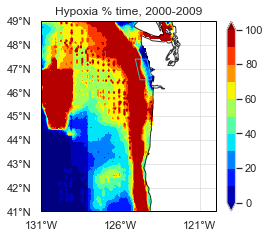

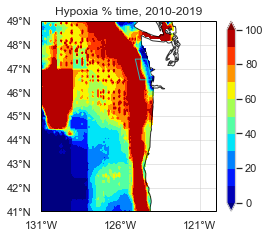

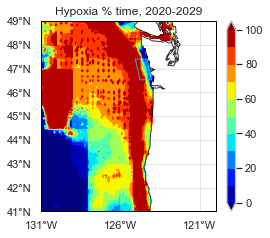

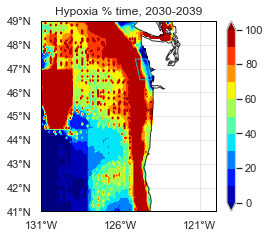

...

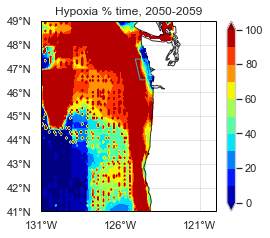

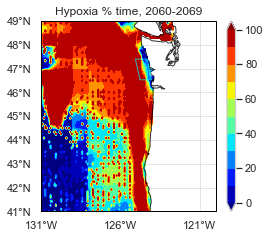

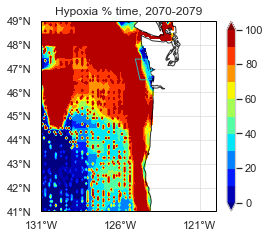

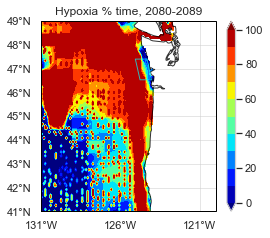

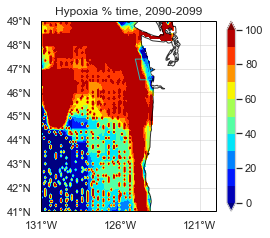

In [53]:
ssplist=['ssp245','ssp585']
uncertain=[]
extreme=[]
diff=[]
diff_unc=[]
for ssp in ssplist:
    # read model thetao bottom
    import os
    var='thetao'
    svar=loc +" "+ var
    fdir='/Volumes/GoogleDrive/My Drive/QIN/data/'+svar+'/'+ssp+'/'

    clim_s ='1993-01-01'
    clim_e='2019-12-31'

    nbr_mdl=0
    mhw_mdl=[]

    sst_mdl=[]

    model_name=[]
    #rlzn=[]
    for filename in os.listdir(fdir):
        fn=fdir+filename

        print(fn)
        dt=xr.open_dataset(fn)
        dt.close()
        sst_mdl.append(dt)

        mdl = filename.split('_')[0]
        rl = filename.split('_')[1]

        nbr_mdl+=1
        print('model name:' +mdl)
        print('this is model number: ' +str(nbr_mdl))

        mhws=mhw_region(fn,detrend=if_detrend,ssp=ssp)
        mhw_mdl.append(mhws)

        #clim=dt[var].sel(time=slice(clim_s , clim_e)).groupby('time.month').mean('time')
        #anom=dt[var].groupby('time.month')-clim
        #thre_90 = anom.sel(time=slice(clim_s ,clim_e)).quantile(.9,dim='time')
        #ssta_mdl.append(anom)
        #ssta_thre.append(thre_90)
        model_name.append(mdl+rl)
        #rlzn.append(rl)
    mhw_mdl = xr.DataArray(np.array(mhw_mdl),                                 
              name=var,             
              coords={'model':model_name,'decade': range(1990,2099,10) ,'lat':dt.lat ,'lon':dt.lon},    
              dims=('model','decade','lat','lon') )


    # read model o2 bottom
    import os
    var='o2'
    svar=loc +" "+ var
    fdir='/Volumes/GoogleDrive/My Drive/QIN/data/'+svar+'/'+ssp+'/'

    clim_s ='1993-01-01'
    clim_e='2019-12-31'

    nbr_mdl=0
    hypoxia_mdl=[]
    o2_mdl=[]

    model_name=[]

    for filename in os.listdir(fdir):
        fn=fdir+filename
        dt=xr.open_dataset(fn)
        dt.close()
        o2_mdl.append(dt)

        mdl = filename.split('_')[0]
        rl = filename.split('_')[1]
        nbr_mdl+=1
        print('model name:' +mdl)
        print('this is model number: ' +str(nbr_mdl))
        hypoxia=hypoxia_region(fn)

        hypoxia_mdl.append(hypoxia)
        model_name.append(mdl+rl)

    hypoxia_mdl = xr.DataArray(np.array(hypoxia_mdl),                                 
              name=var,             
              coords={'model':model_name,'decade': range(1990,2099,10) ,'lat':dt.lat ,'lon':dt.lon},    
              dims=('model','decade','lat','lon') )

    p1_s ='1993-01-01'
    p1_e='2019-12-31'

    p2_s ='2040-01-01'
    p2_e='2060-12-31'


    p1_mhw = mhw_mdl.mean('model').sel(decade=slice(p1_s,p1_e)).mean('decade')
    p2_mhw = mhw_mdl.mean('model').sel(decade=slice(p2_s,p2_e)).mean('decade')

    p1_m_stdv = mhw_mdl.sel(decade=slice(p1_s,p1_e)).mean('decade').std('model')
    p2_m_stdv = mhw_mdl.sel(decade=slice(p2_s,p2_e)).mean('decade').std('model')

    p1_hypoxia = hypoxia_mdl.mean('model').sel(decade=slice(p1_s,p1_e)).mean('decade')
    p2_hypoxia = hypoxia_mdl.mean('model').sel(decade=slice(p2_s,p2_e)).mean('decade')

    p1_h_stdv = hypoxia_mdl.sel(decade=slice(p1_s,p1_e)).mean('decade').std('model')
    p2_h_stdv = hypoxia_mdl.sel(decade=slice(p2_s,p2_e)).mean('decade').std('model')

    m_diff = p2_mhw - p1_mhw
    m_diff_unc = (mhw_mdl.sel(decade=slice(p2_s,p2_e)).mean('decade')-mhw_mdl.sel(decade=slice(p1_s,p1_e)).mean('decade')).std('model')
    
    h_diff = p2_hypoxia - p1_hypoxia
    h_diff_unc = (hypoxia_mdl.sel(decade=slice(p2_s,p2_e)).mean('decade')-hypoxia_mdl.sel(decade=slice(p1_s,p1_e)).mean('decade')).std('model')


    
    temp1=[p1_m_stdv,p1_h_stdv,p2_m_stdv,p2_h_stdv]
    temp2=[p1_mhw,p1_hypoxia,p2_mhw,p2_hypoxia]
    temp3=[m_diff,h_diff]
    temp4=[m_diff_unc,h_diff_unc]
    uncertain.append(temp1)
    extreme.append(temp2)
    diff.append(temp3)
    diff_unc.append(temp4)

In [25]:
uncertain_245=uncertain[0]
uncertain_585=uncertain[1]
extreme_245=extreme[0]
extreme_585=extreme[1]

In [26]:
# regional domain
ldom = np.array([[43, 48.5],[-129, -123]]) # 230, 237
lqin = np.array([[46.25, 47.75],[-125.5, -123.5]]) # 230, 237 # domain for zoom in map
# QIN region
qbox = np.array([[-124.05,-124.33,-125.07,-124.774,-124.05],[46.53,47.4,47.4,46.53,46.53]]) 
# calendar.month_name[mon]

In [27]:
fn = './ETOPO1_QIN.nc'
ds_topo = xr.open_dataset(fn)
ds_topo.close()
topo = ds_topo.z.sel(y=slice(ldom[0,0],ldom[0,1]),x=slice(ldom[1,0],ldom[1,1]))
X,Y=np.meshgrid(topo.x,topo.y)

In [28]:
#######plot####### 43, 48.5],[-129, -123]

In [51]:
def plot_extreme(region,save=False):
    vmin=0
    vmax=101
    lev=np.arange(vmin,vmax,10)

    fig=plt.figure(figsize=(9,10),dpi=300)
    sns.set(style="whitegrid",palette="tab10")
    palette=plt.get_cmap("Spectral").reversed()


    for i in range(3):
        ax=plt.subplot(3,3,i*3+1,projection=ccrs.PlateCarree())
        ds=extreme_245[i]
        if region == 'large':
            lat1 = int(np.floor(ds.lat[0].data))
            lat2 = int(np.ceil(ds.lat[-1].data))
            lon1 = int(np.floor(ds.lon[0].data))
            lon2 = int(np.ceil(ds.lon[-1].data))
        if region == 'qin':
            lat1 = 46
            lat2 = 48
            lon1 = -126
            lon2 = -123

        ax.coastlines(resolution='50m',linewidth=1,color='black',alpha=0.8,zorder=1)
        ax.add_feature(cfeature.LAND, color='lightgrey')
        ax.set_extent([lon1,lon2,lat1,lat2],crs=ccrs.PlateCarree())
        ax.xaxis.set_major_formatter(LongitudeFormatter(zero_direction_label=True))
        ax.yaxis.set_major_formatter(LatitudeFormatter())
        if region == 'large':
            ax.set_xticks([-130,-125,-120], crs=ccrs.PlateCarree())
            ax.set_yticks([42,45,48], crs=ccrs.PlateCarree())
        if region == 'qin':
            ax.set_xticks([-126,-125,-124,-123], crs=ccrs.PlateCarree())
            ax.set_yticks([46,47,48], crs=ccrs.PlateCarree())

        im=plt.contourf(ds.lon,ds.lat,ds,lev, cmap=palette)
        plt.contour(X,Y,topo,[-3000,-2000,-1000,-500,-200,-150, -100,-50],colors='k',linewidths=0.5, linestyles='solid', zorder=3, alpha=0.5)
        plt.plot(qbox[0,:],qbox[1,:],c='k',lw=2,zorder=5, alpha=0.7)


        if i==0:
            plt.title(p1_s.split('-')[0]+'-'+p1_e.split('-')[0])
        if i==3:
            plt.title(p2_s.split('-')[0]+'-'+p2_e.split('-')[0]+ ' (ssp245)')
        if region == 'large':    
            if i == 0 or i==3:
                plt.text(lon2-2.3-360,lat1+.5,'MHW') 
            if i == 1 or i==4:
                plt.text(lon2-3.4-360,lat1+.5,'Hypoxia') 
            if i == 2 or i==5:
                plt.text(lon2-4.1-360,lat1+.5,'Combined')  
        if region == 'qin':    
            if i == 0 or i==3:
                plt.text(lon2-0.7,lat1+1.8,'MHW') 
            if i == 1 or i==4:
                plt.text(lon2-1.,lat1+1.8,'Hypoxia') 
            if i == 2 or i==5:
                plt.text(lon2-1.2,lat1+1.8,'Combined') 

        ax.set_aspect(1.5)

    for i in range(3,6):
        ax=plt.subplot(3,3,(i-3)*3+2,projection=ccrs.PlateCarree())
        ds=extreme_245[i]
        if region == 'large':
            lat1 = int(np.floor(ds.lat[0].data))
            lat2 = int(np.ceil(ds.lat[-1].data))
            lon1 = int(np.floor(ds.lon[0].data))
            lon2 = int(np.ceil(ds.lon[-1].data))
        if region == 'qin':
            lat1 = 46
            lat2 = 48
            lon1 = -126
            lon2 = -123

        ax.coastlines(resolution='50m',linewidth=1,color='black',alpha=0.8,zorder=1)
        ax.add_feature(cfeature.LAND, color='lightgrey')
        ax.set_extent([lon1,lon2,lat1,lat2],crs=ccrs.PlateCarree())
        ax.xaxis.set_major_formatter(LongitudeFormatter(zero_direction_label=True))
        ax.yaxis.set_major_formatter(LatitudeFormatter())
 
        if region == 'large':
            ax.set_xticks([-130,-125,-120], crs=ccrs.PlateCarree())
            ax.set_yticks([42,45,48], crs=ccrs.PlateCarree())
        if region == 'qin':
            ax.set_xticks([-126,-125,-124,-123], crs=ccrs.PlateCarree())
            ax.set_yticks([46,47,48], crs=ccrs.PlateCarree())

        im=plt.contourf(ds.lon,ds.lat,ds,lev, cmap=palette)
        plt.plot(qbox[0,:],qbox[1,:],c='k',lw=2,zorder=5, alpha=0.7)

        if i==0:
            plt.title(p1_s.split('-')[0]+'-'+p1_e.split('-')[0])
        if i==3:
            plt.title(p2_s.split('-')[0]+'-'+p2_e.split('-')[0]+ ' (ssp245)')
        if region == 'large':    
            if i == 0 or i==3:
                plt.text(lon2-2.3-360,lat1+.5,'MHW') 
            if i == 1 or i==4:
                plt.text(lon2-3.4-360,lat1+.5,'Hypoxia') 
            if i == 2 or i==5:
                plt.text(lon2-4.1-360,lat1+.5,'Combined')  
        if region == 'qin':    
            if i == 0 or i==3:
                plt.text(lon2-0.7,lat1+1.8,'MHW') 
            if i == 1 or i==4:
                plt.text(lon2-1.,lat1+1.8,'Hypoxia') 
            if i == 2 or i==5:
                plt.text(lon2-1.2,lat1+1.8,'Combined') 
  

        ax.set_aspect(1.5)


    for i in range(3,6):
        ax=plt.subplot(3,3,(i-2)*3,projection=ccrs.PlateCarree())
        ds=extreme_585[i]
        if region == 'large':
            lat1 = int(np.floor(ds.lat[0].data))
            lat2 = int(np.ceil(ds.lat[-1].data))
            lon1 = int(np.floor(ds.lon[0].data))
            lon2 = int(np.ceil(ds.lon[-1].data))
        if region == 'qin':
            lat1 = 46
            lat2 = 48
            lon1 = -126
            lon2 = -123
        ax.coastlines(resolution='50m',linewidth=1,color='black',alpha=0.8,zorder=1)
        ax.add_feature(cfeature.LAND, color='lightgrey')
        ax.set_extent([lon1,lon2,lat1,lat2],crs=ccrs.PlateCarree())
        ax.xaxis.set_major_formatter(LongitudeFormatter(zero_direction_label=True))
        ax.yaxis.set_major_formatter(LatitudeFormatter())
 
        if region == 'large':
            ax.set_xticks([-130,-125,-120], crs=ccrs.PlateCarree())
            ax.set_yticks([42,45,48], crs=ccrs.PlateCarree())
        if region == 'qin':
            ax.set_xticks([-126,-125,-124,-123], crs=ccrs.PlateCarree())
            ax.set_yticks([46,47,48], crs=ccrs.PlateCarree())

        im=plt.contourf(ds.lon,ds.lat,ds,lev, cmap=palette)
        plt.plot(qbox[0,:],qbox[1,:],c='k',lw=2,zorder=5, alpha=0.7)

        if i==0:
            plt.title(p1_s.split('-')[0]+'-'+p1_e.split('-')[0])
        if i==3:
            plt.title(p2_s.split('-')[0]+'-'+p2_e.split('-')[0]+ ' (ssp585)')
        if region == 'large':    
            if i == 0 or i==3:
                plt.text(lon2-2.3-360,lat1+.5,'MHW') 
            if i == 1 or i==4:
                plt.text(lon2-3.4-360,lat1+.5,'Hypoxia') 
            if i == 2 or i==5:
                plt.text(lon2-4.1,lat1+.5,'Combined')  
        if region == 'qin':    
            if i == 0 or i==3:
                plt.text(lon2-0.7,lat1+1.8,'MHW') 
            if i == 1 or i==4:
                plt.text(lon2-1.,lat1+1.8,'Hypoxia') 
            if i == 2 or i==5:
                plt.text(lon2-1.2,lat1+1.8,'Combined') 
 

        ax.set_aspect(1.5)

    cax = plt.axes([0.95, 0.37, 0.015, 0.3])
    cbar = plt.colorbar(im,cax=cax,fraction=0.04, pad=0.05,orientation ='vertical')
    cbar.ax.set_title('%', rotation=0,loc='left', fontsize=15)

    fig.suptitle(loc+' conditions',fontsize=15)
    if save==True:
        plt.savefig(figdir+loc+region+'_extreme.png',dpi=300, bbox_inches = "tight")
    plt.tight_layout(h_pad=2)
    plt.show()    

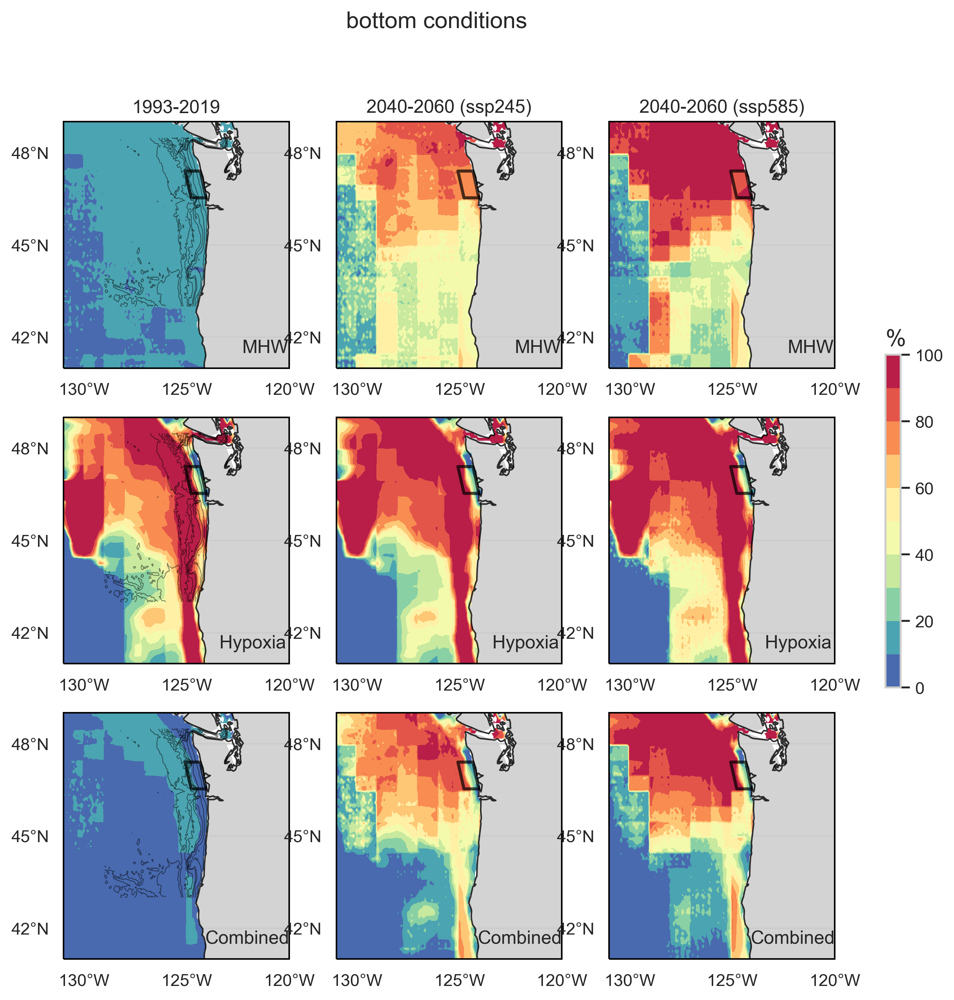

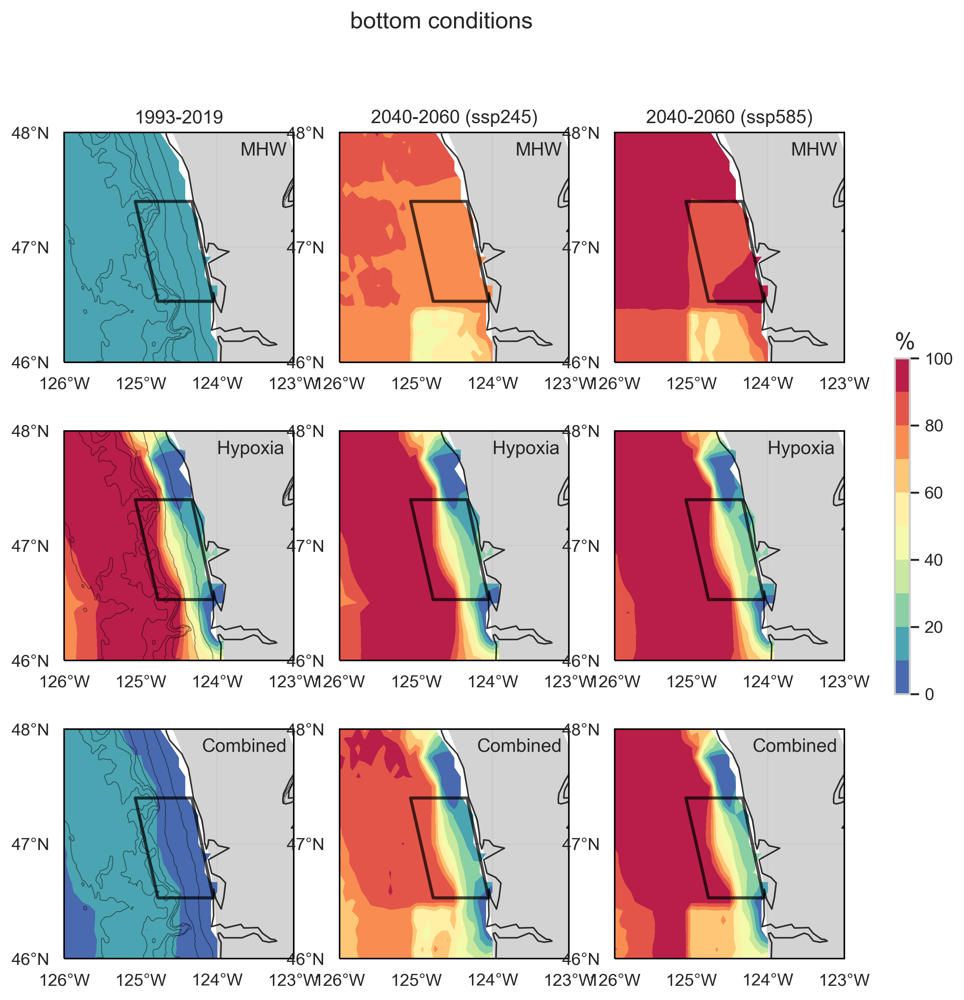

In [52]:
plot_extreme('large')
plot_extreme('qin')

In [30]:
def plot_uncertain(region,save=False):
    vmin=0
    vmax=41#np.round(uncertain_245[4].max(),0)
    lev=np.arange(vmin,vmax,5)

    fig=plt.figure(figsize=(9,10),dpi=300)
    sns.set(style="whitegrid",palette="tab10")
    palette=plt.get_cmap("Spectral").reversed()


    for i in range(3):
        ax=plt.subplot(3,3,i*3+1,projection=ccrs.PlateCarree())
        ds=uncertain_245[i]
        if region == 'large':
            lat1 = int(np.floor(ds.lat[0].data))
            lat2 = int(np.ceil(ds.lat[-1].data))
            lon1 = int(np.floor(ds.lon[0].data))
            lon2 = int(np.ceil(ds.lon[-1].data))
        if region == 'qin':
            lat1 = 46
            lat2 = 48
            lon1 = -126
            lon2 = -123

        ax.coastlines(resolution='50m',linewidth=1,color='black',alpha=0.8,zorder=1)
        ax.set_extent([lon1,lon2,lat1,lat2],crs=ccrs.PlateCarree())
        if region == 'large':
            ax.set_xticks([-130,-125,-120], crs=ccrs.PlateCarree())
            ax.set_yticks([42,45,48], crs=ccrs.PlateCarree())
        if region == 'qin':
            ax.set_xticks([-126,-125,-124,-123], crs=ccrs.PlateCarree())
            ax.set_yticks([46,47,48], crs=ccrs.PlateCarree())

        im=plt.contourf(ds.lon,ds.lat,ds,lev, cmap=palette)
        plt.contour(qin.lon,qin.lat,qin.polygon_mask,levels=[1], colors='white')
        plt.contour(eez.lon,eez.lat,eez.region_mask,levels=[1], colors='white')
        if i==0:
            plt.title(p1_s.split('-')[0]+'-'+p1_e.split('-')[0])
        if i==3:
            plt.title(p2_s.split('-')[0]+'-'+p2_e.split('-')[0]+ ' (ssp245)')
        if region == 'large':    
            if i == 0 or i==3:
                plt.text(lon2-2.3-360,lat1+.5,'MHW') 
            if i == 1 or i==4:
                plt.text(lon2-3.4-360,lat1+.5,'Hypoxia') 
            if i == 2 or i==5:
                plt.text(lon2-4.1-360,lat1+.5,'Combined')  
        if region == 'qin':    
            if i == 0 or i==3:
                plt.text(lon2-0.7,lat1+1.8,'MHW') 
            if i == 1 or i==4:
                plt.text(lon2-1.,lat1+1.8,'Hypoxia') 
            if i == 2 or i==5:
                plt.text(lon2-1.2,lat1+1.8,'Combined') 

        ax.set_aspect(1.5)

    for i in range(3,6):
        ax=plt.subplot(3,3,(i-3)*3+2,projection=ccrs.PlateCarree())
        ds=uncertain_245[i]
        if region == 'large':
            lat1 = int(np.floor(ds.lat[0].data))
            lat2 = int(np.ceil(ds.lat[-1].data))
            lon1 = int(np.floor(ds.lon[0].data))
            lon2 = int(np.ceil(ds.lon[-1].data))
        if region == 'qin':
            lat1 = 46
            lat2 = 48
            lon1 = -126
            lon2 = -123

        ax.coastlines(resolution='50m',linewidth=1,color='black',alpha=0.8,zorder=1)
        ax.set_extent([lon1,lon2,lat1,lat2],crs=ccrs.PlateCarree())
        if region == 'large':
            ax.set_xticks([-130,-125,-120], crs=ccrs.PlateCarree())
            ax.set_yticks([42,45,48], crs=ccrs.PlateCarree())
        if region == 'qin':
            ax.set_xticks([-126,-125,-124,-123], crs=ccrs.PlateCarree())
            ax.set_yticks([46,47,48], crs=ccrs.PlateCarree())

        im=plt.contourf(ds.lon,ds.lat,ds,lev, cmap=palette)
        plt.contour(qin.lon,qin.lat,qin.polygon_mask,levels=[1], colors='white')
        plt.contour(eez.lon,eez.lat,eez.region_mask,levels=[1], colors='white')
        if i==0:
            plt.title(p1_s.split('-')[0]+'-'+p1_e.split('-')[0])
        if i==3:
            plt.title(p2_s.split('-')[0]+'-'+p2_e.split('-')[0]+ ' (ssp245)')
        if region == 'large':    
            if i == 0 or i==3:
                plt.text(lon2-2.3-360,lat1+.5,'MHW') 
            if i == 1 or i==4:
                plt.text(lon2-3.4-360,lat1+.5,'Hypoxia') 
            if i == 2 or i==5:
                plt.text(lon2-4.1-360,lat1+.5,'Combined')  
        if region == 'qin':    
            if i == 0 or i==3:
                plt.text(lon2-0.7,lat1+1.8,'MHW') 
            if i == 1 or i==4:
                plt.text(lon2-1.,lat1+1.8,'Hypoxia') 
            if i == 2 or i==5:
                plt.text(lon2-1.2,lat1+1.8,'Combined') 
 

        ax.set_aspect(1.5)


    for i in range(3,6):
        ax=plt.subplot(3,3,(i-2)*3,projection=ccrs.PlateCarree())
        ds=uncertain_585[i]
        if region == 'large':
            lat1 = int(np.floor(ds.lat[0].data))
            lat2 = int(np.ceil(ds.lat[-1].data))
            lon1 = int(np.floor(ds.lon[0].data))
            lon2 = int(np.ceil(ds.lon[-1].data))
        if region == 'qin':
            lat1 = 46
            lat2 = 48
            lon1 = -126
            lon2 = -123
        ax.coastlines(resolution='50m',linewidth=1,color='black',alpha=0.8,zorder=1)
        ax.set_extent([lon1,lon2,lat1,lat2],crs=ccrs.PlateCarree())
        if region == 'large':
            ax.set_xticks([-130,-125,-120], crs=ccrs.PlateCarree())
            ax.set_yticks([42,45,48], crs=ccrs.PlateCarree())
        if region == 'qin':
            ax.set_xticks([-126,-125,-124,-123], crs=ccrs.PlateCarree())
            ax.set_yticks([46,47,48], crs=ccrs.PlateCarree())

        im=plt.contourf(ds.lon,ds.lat,ds,lev, cmap=palette)
        plt.contour(qin.lon,qin.lat,qin.polygon_mask,levels=[1], colors='white')
        plt.contour(eez.lon,eez.lat,eez.region_mask,levels=[1], colors='white')

        if i==3:
            plt.title(p2_s.split('-')[0]+'-'+p2_e.split('-')[0]+ ' (ssp585)')
        if region == 'large':    
            if i == 0 or i==3:
                plt.text(lon2-2.3-360,lat1+.5,'MHW') 
            if i == 1 or i==4:
                plt.text(lon2-3.4-360,lat1+.5,'Hypoxia') 
            if i == 2 or i==5:
                plt.text(lon2-4.1,lat1+.5,'Combined')  
        if region == 'qin':    
            if i == 0 or i==3:
                plt.text(lon2-0.7,lat1+1.8,'MHW') 
            if i == 1 or i==4:
                plt.text(lon2-1.,lat1+1.8,'Hypoxia') 
            if i == 2 or i==5:
                plt.text(lon2-1.2,lat1+1.8,'Combined')  

        ax.set_aspect(1.5)

    cax = plt.axes([0.95, 0.37, 0.015, 0.3])
    cbar = plt.colorbar(im,cax=cax,fraction=0.04, pad=0.05,orientation ='vertical')
    cbar.ax.set_title('%', rotation=0,loc='left', fontsize=15)

    fig.suptitle(loc+' uncertainties',fontsize=15)
    if save==True:
        plt.savefig(figdir+loc+region+'_extreme.png',dpi=300, bbox_inches = "tight")
    #plt.tight_layout()
    plt.show()    

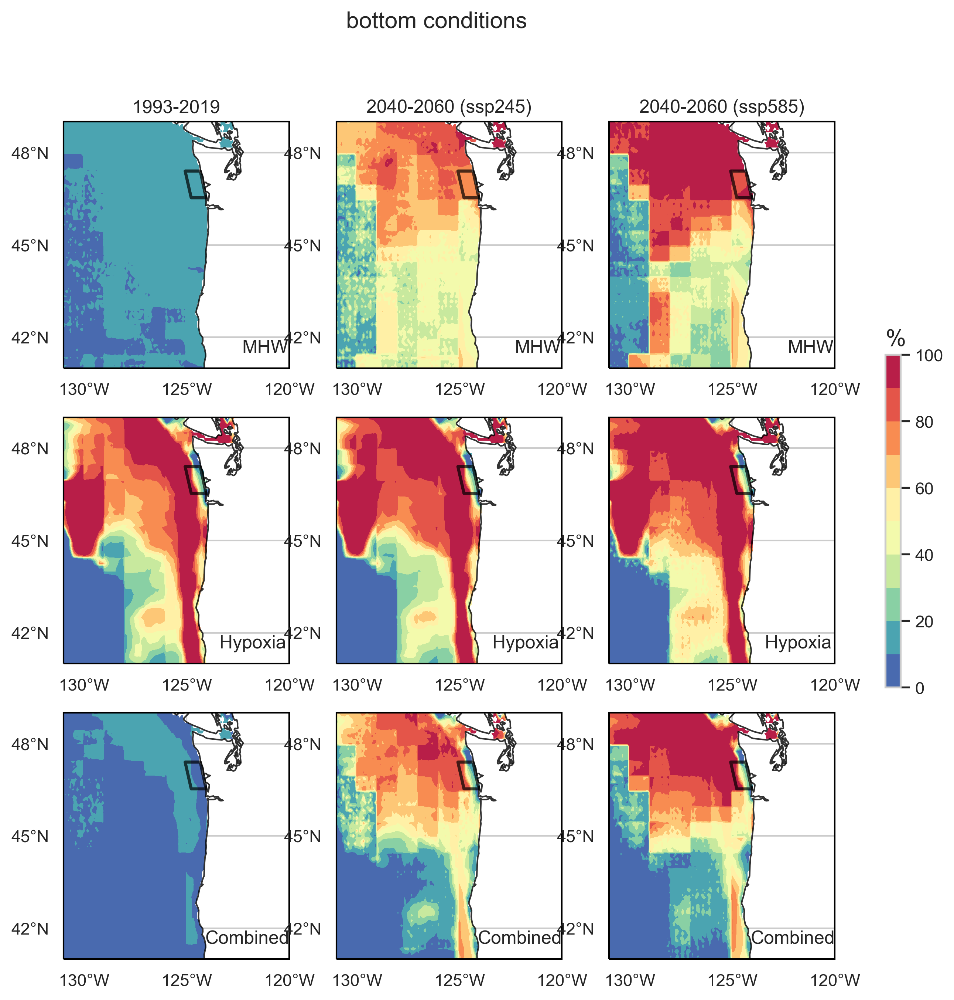

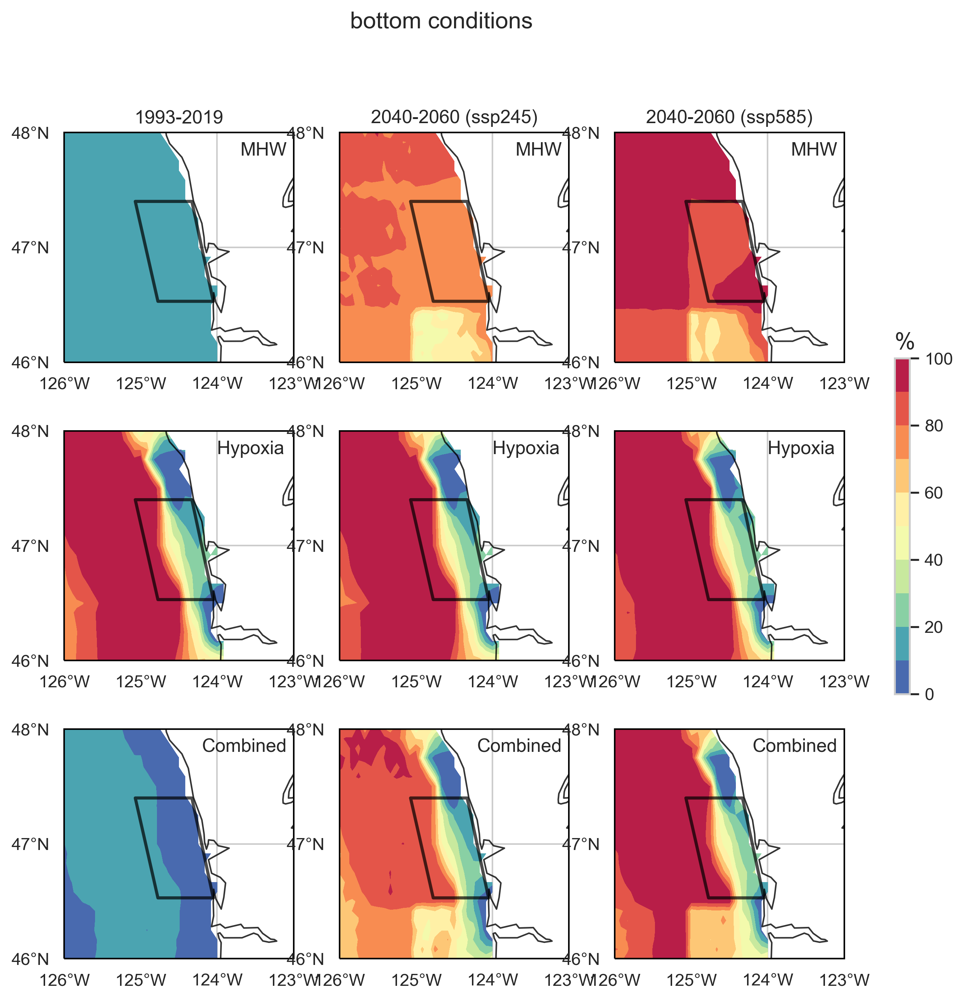

In [39]:
plot_extreme('large')
plot_extreme('qin')

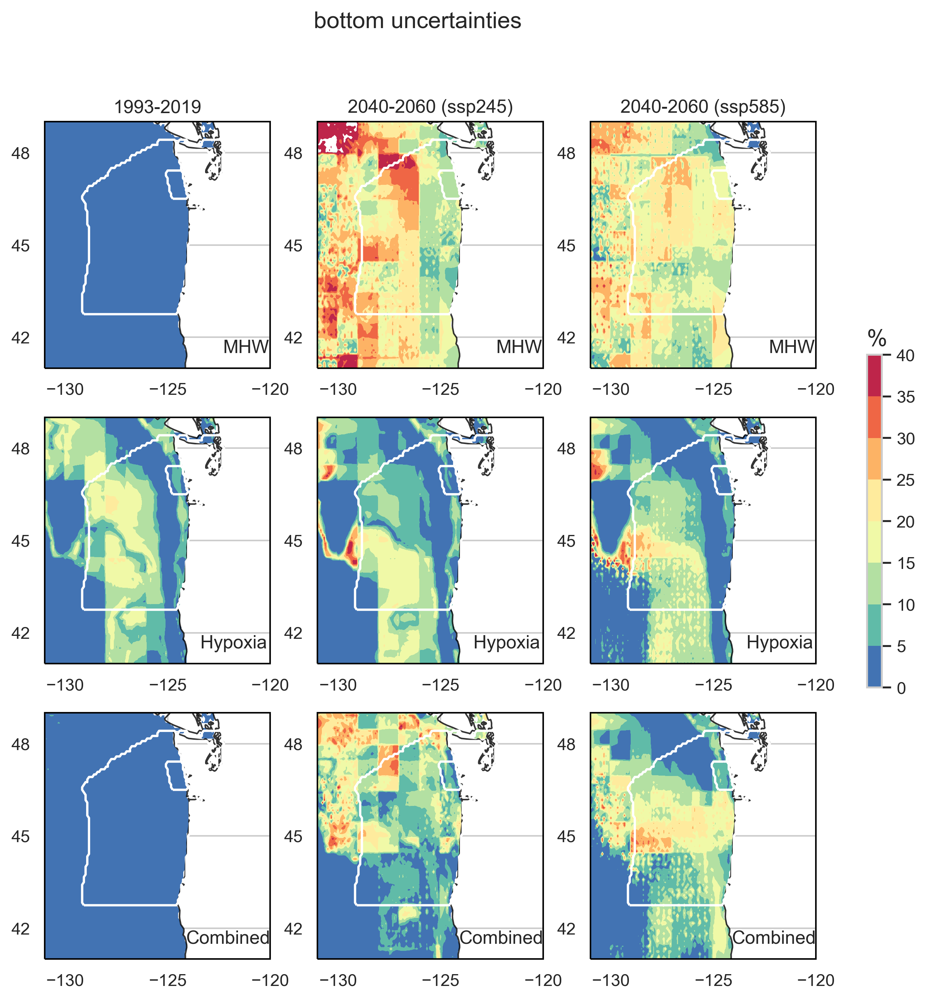

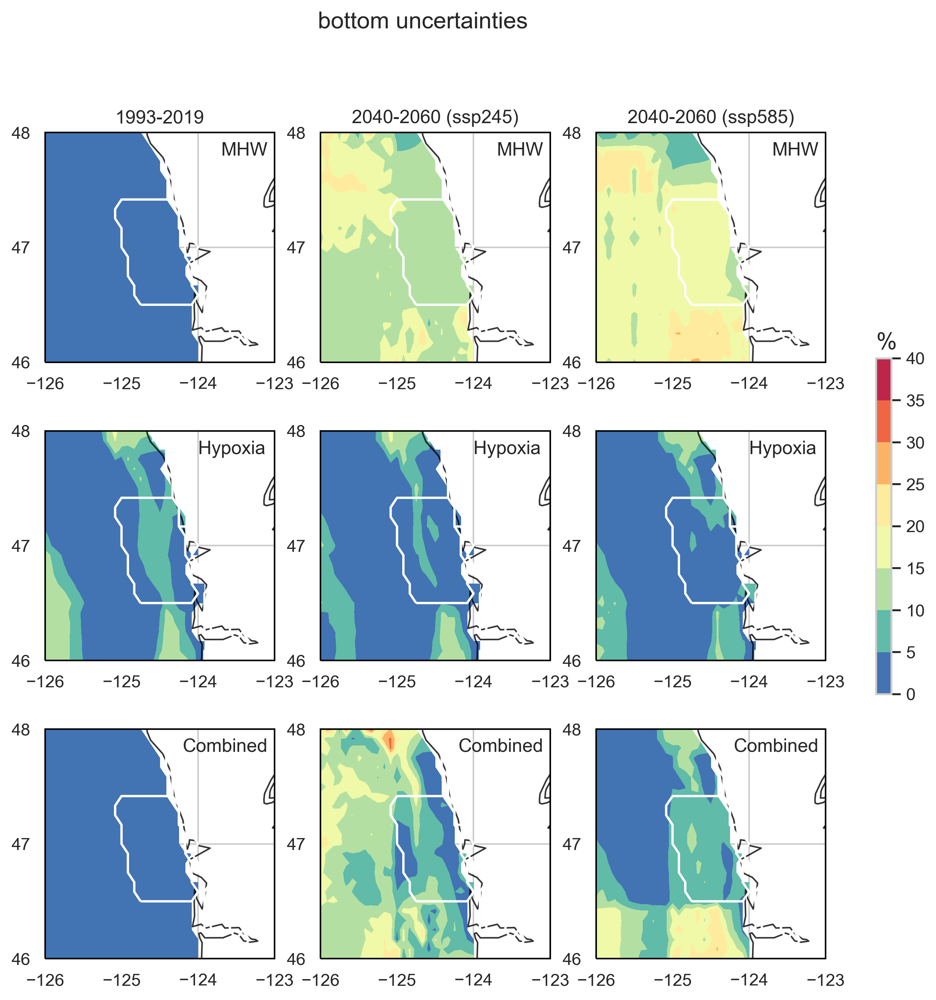

In [33]:
plot_uncertain('large')
plot_uncertain('qin')

In [34]:
def plot_diff(region, save=False):


    fig=plt.figure(figsize=(6,8),dpi=300)
    sns.set(style="whitegrid",palette="tab10")
    palette='RdBu_r'#plt.get_cmap("Spectral").reversed()
    ssplist=['ssp245','ssp585']
    i=0
        
    for ssp in ssplist:
        if ssp=='ssp245':
            kk=0
        if ssp=='ssp585':
            kk=1
        vmin=-100
        vmax=101
        lev=np.arange(vmin,vmax,10)
        ax=plt.subplot(3,2,i+1,projection=ccrs.PlateCarree())
        rob=diff_unc[kk][0]
        delta=diff[kk][0]
        ds=delta.where(delta>=rob)

        if region == 'large':
            lat1 = int(np.floor(ds.lat[0].data))
            lat2 = int(np.ceil(ds.lat[-1].data))
            lon1 = int(np.floor(ds.lon[0].data))
            lon2 = int(np.ceil(ds.lon[-1].data))
        if region == 'qin':
            lat1 = 46
            lat2 = 48
            lon1 = -126
            lon2 = -123

        ax.coastlines(resolution='50m',linewidth=1,color='black',alpha=0.8,zorder=1)
        ax.set_extent([lon1,lon2,lat1,lat2],crs=ccrs.PlateCarree())
        if region == 'large':
            ax.set_xticks([-130,-125,-120], crs=ccrs.PlateCarree())
            ax.set_yticks([42,45,48], crs=ccrs.PlateCarree())
        if region == 'qin':
            ax.set_xticks([-126,-125,-124,-123], crs=ccrs.PlateCarree())
            ax.set_yticks([46,47,48], crs=ccrs.PlateCarree())

        im=plt.contourf(ds.lon,ds.lat,ds,lev, cmap=palette)
        plt.contour(qin.lon,qin.lat,qin.polygon_mask,levels=[1], colors='white')
        plt.contour(eez.lon,eez.lat,eez.region_mask,levels=[1], colors='white')
        
        if region == 'large':    
            plt.text(lon2-3.6-360,lat1+.5,ssp)  
        if region == 'qin':    
            plt.text(lon2-0.9,lat1+1.8,ssp) 

        ax.set_aspect(1.5)
        i+=1
    cax = plt.axes([0.92, 0.69, 0.007, 0.15])
    cbar = plt.colorbar(im,cax=cax,fraction=0.04, pad=0.05,orientation ='vertical')
    cbar.ax.set_title('%', rotation=0,loc='left', fontsize=15)
    
    for ssp in ssplist:
        if ssp=='ssp245':
            kk=0
        if ssp=='ssp585':
            kk=1
        vmin=-50
        vmax=51
        lev=np.arange(vmin,vmax,10)
        ax=plt.subplot(3,2,i+1,projection=ccrs.PlateCarree())
        delta=diff[kk][1]
        rob=diff_unc[kk][1]
        ds=delta.where(delta>=rob)


        if region == 'large':
            lat1 = int(np.floor(ds.lat[0].data))
            lat2 = int(np.ceil(ds.lat[-1].data))
            lon1 = int(np.floor(ds.lon[0].data))
            lon2 = int(np.ceil(ds.lon[-1].data))
        if region == 'qin':
            lat1 = 46
            lat2 = 48
            lon1 = -126
            lon2 = -123

        ax.coastlines(resolution='50m',linewidth=1,color='black',alpha=0.8,zorder=1)
        ax.set_extent([lon1,lon2,lat1,lat2],crs=ccrs.PlateCarree())
        if region == 'large':
            ax.set_xticks([-130,-125,-120], crs=ccrs.PlateCarree())
            ax.set_yticks([42,45,48], crs=ccrs.PlateCarree())
        if region == 'qin':
            ax.set_xticks([-126,-125,-124,-123], crs=ccrs.PlateCarree())
            ax.set_yticks([46,47,48], crs=ccrs.PlateCarree())

        im=plt.contourf(ds.lon,ds.lat,ds,lev, cmap=palette)
        plt.contour(qin.lon,qin.lat,qin.polygon_mask,levels=[1], colors='white')
        plt.contour(eez.lon,eez.lat,eez.region_mask,levels=[1], colors='white')
        
        if region == 'large':    
            plt.text(lon2-3.6-360,lat1+.5,ssp)  
        if region == 'qin':    
            plt.text(lon2-0.9,lat1+1.8,ssp) 

        ax.set_aspect(1.5)
        i+=1
    cax = plt.axes([0.92, 0.42, 0.007, 0.15])    
    cbar = plt.colorbar(im,cax=cax,fraction=0.04, pad=0.05,orientation ='vertical')
    cbar.ax.set_title('%', rotation=0,loc='left', fontsize=15)
    
    for ssp in ssplist:
        if ssp=='ssp245':
            kk=0
        if ssp=='ssp585':
            kk=1
        vmin=-100
        vmax=101
        lev=np.arange(vmin,vmax,10)
        ax=plt.subplot(3,2,i+1,projection=ccrs.PlateCarree())
        delta=diff[kk][2]
        rob=diff_unc[kk][2]
        ds=delta.where(delta>=rob)
        if region == 'large':
            lat1 = int(np.floor(ds.lat[0].data))
            lat2 = int(np.ceil(ds.lat[-1].data))
            lon1 = int(np.floor(ds.lon[0].data))
            lon2 = int(np.ceil(ds.lon[-1].data))
        if region == 'qin':
            lat1 = 46
            lat2 = 48
            lon1 = -126
            lon2 = -123

        ax.coastlines(resolution='50m',linewidth=1,color='black',alpha=0.8,zorder=1)
        ax.set_extent([lon1,lon2,lat1,lat2],crs=ccrs.PlateCarree())
        if region == 'large':
            ax.set_xticks([-130,-125,-120], crs=ccrs.PlateCarree())
            ax.set_yticks([42,45,48], crs=ccrs.PlateCarree())
        if region == 'qin':
            ax.set_xticks([-126,-125,-124,-123], crs=ccrs.PlateCarree())
            ax.set_yticks([46,47,48], crs=ccrs.PlateCarree())

        im=plt.contourf(ds.lon,ds.lat,ds,lev, cmap=palette)
        plt.contour(qin.lon,qin.lat,qin.polygon_mask,levels=[1], colors='white')
        plt.contour(eez.lon,eez.lat,eez.region_mask,levels=[1], colors='white')
        
        if region == 'large':   
            if ssp == 'ssp585':
                plt.text(lon2-3.6,lat1+.5,ssp)
            if ssp == 'ssp245':
                plt.text(lon2-3.6-360,lat1+.5,ssp)  
        if region == 'qin':    
            plt.text(lon2-0.9,lat1+1.8,ssp) 

        ax.set_aspect(1.5)
        i+=1
    cax = plt.axes([0.92, 0.15, 0.007, 0.15])
    cbar = plt.colorbar(im,cax=cax,fraction=0.04, pad=0.05,orientation ='vertical')
    cbar.ax.set_title('%', rotation=0,loc='left', fontsize=15)
           


    #cax = plt.axes([0.95, 0.37, 0.015, 0.3])
    #cbar = plt.colorbar(im,cax=cax,fraction=0.04, pad=0.05,orientation ='vertical')
    #cbar.ax.set_title('%', rotation=0,loc='left', fontsize=15)

    fig.suptitle(loc+' diff '+p2_s.split('-')[0]+'-'+p2_e.split('-')[0]+' minus '+p1_s.split('-')[0]+'-'+p1_e.split('-')[0],fontsize=15)
    if save==True:
        plt.savefig(figdir+loc+region+'_extreme.png',dpi=300, bbox_inches = "tight")
    #plt.tight_layout()
    plt.show()    

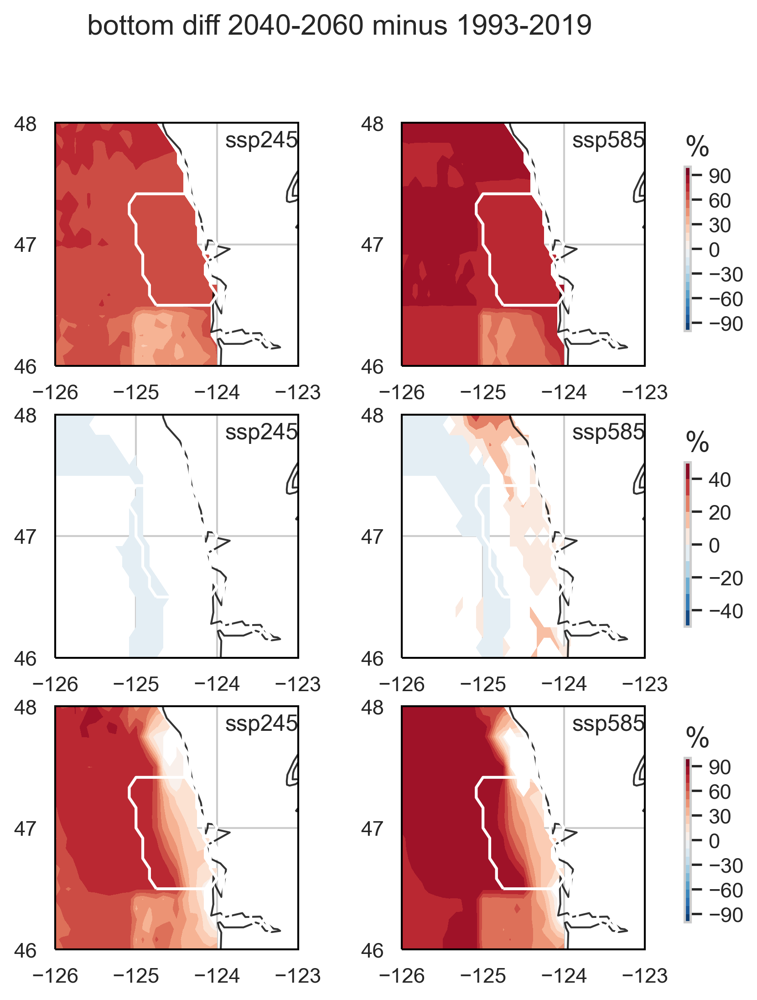

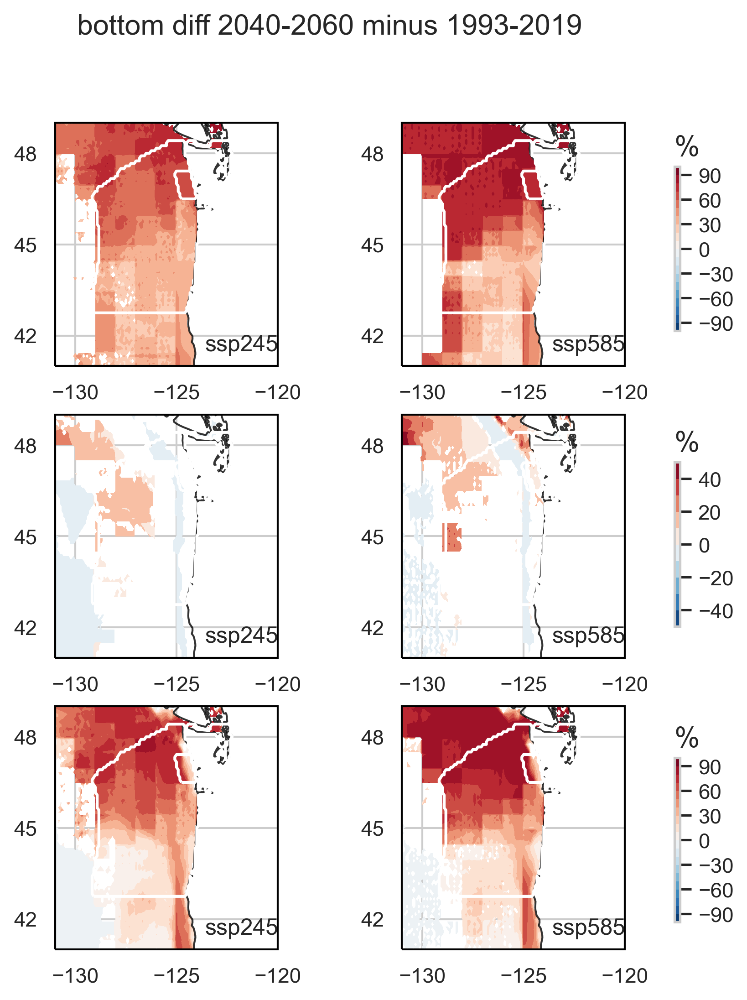

In [35]:
plot_diff('qin')
plot_diff('large')